Name: Nguyễn Thọ Anh Khoa

Facebook: Khoa Nguyen KT

#Exploitation of Pretrained Models
#(Object detection and tracking)

In [ ]:
cd "/content/drive/MyDrive/AI_research/AI_INSIGHT/HW20-21/"

/content/drive/MyDrive/AI_research/AI_INSIGHT/HW20-21


## 1) Các bạn download data và các file code cho bài toán object detection ở link sau
https://www.dropbox.com/sh/girzzlqrvja43qr/AABFBqiuh36AfNE22KY4vd4Da?dl=0

# 2) Các bạn download data và các file code cho bài toán object tracking ở link sau
https://www.dropbox.com/sh/lduoraw2srqb9pb/AAB0T3zTgWTQt4f2JCVppYXya?dl=0

## 3) Đọc hiểu code từ các file jupyter để hiểu về cách thao tác data và network cho hai bài toán object detection và tracking.

###**Object Detection**
Input: image 

Output: bounding box có chưa object và phân loại class của object đó 

- Idea1: Sử dụng 1 mạng classification có sẵn không cần train
      -> Tạo một window có kích thước bằng input của classification network.
      -> Trượt window trên toàn ảnh 
      -> Mỗi 1 vùng window bao phủ thì cho vào mạng classification để predict
      -> Thu được một list gồm max score của từng vùng, chọn score lớn nhất trong list các max score để  lấy được bouding box (cách thức giống template matching) và class

- Idea2: Tương tự như Idea1 nhưng thu gọn lại số vùng để classification bằng các tính standard deviation.
      -> Dùng 1 window (filter có size ví dụ 7x7) nhỏ hơn window của Input classification, trượt trên toàn bộ ảnh để ghi ghi nhận standard deviation tại từng pixel với window 7x7. Cuối cùng sẽ thu được ảnh gradient của ảnh input. Ý nghĩa của việc này là các vùng ảnh có các pixel tương đồng nhau thì standard deviation sẽ gần bằng = 0 tương đương với việc không có object. Ngược lại standard deviation cao có thể sẽ có object tại vùng đó.
      -> Sau đó dùng window có size của input classifcication trượt trên ảnh mới (ảnh gradient). 
      -> Sum toàn bộ pixel trong vùng của window này nếu nó lớn hơn 1 ngường nhất định thì coi như tồn tại vật thể trong window.
      -> Đem đi qua model để classifcation và get score, và append vào 1 list.
      -> Sau cùng lấy score lớn nhất như Idea1.

- Idea3: Để loại bỏ các nhiễu ví du như màu sắc, background và để chính xác hơn thì 1 window sẽ trượt trên feature được extraction từ model classification. Rồi dùng các layer phân loại của cùng model đó để  phân loại và lấy score. Location trong feature map sẽ được scale về ảnh input ban đầu.
      -> Tách model classification thành 2 phần 1 phần compute feature (feature extractor), 1 phần là các layer phân loại (classifier).
      -> Đưa ảnh gốc vào feature extractor, sẽ thu được 1 feature map miêu tả yếu tố chính của ảnh.
      -> Vì ảnh đầu có kích thước hơn ảnh input khi được train (window trượt trên ảnh gốc của idea1,2) nên feature map có size lớn hơn. Do đó dùng 1 window có size bằng với size của feature map dùng cho ảnh được train của model đó, trượt trên feature map của anh gốc. Rồi dùng các vùng này đi qua classifier. Thu được 1 list các class và score tương ứng.
      -> Lấy score lớn nhấn, rồi scale location từ feature map về lại ảnh gốc input.  

- Idea4: tương tự như 3 nhưng để làm cho nhiều object thì ý tưởng là loại bỏ các obejct có khả năng biểu thị cho một cùng một object bằng các tính distance giữa 2 tọa độ top left của 2 bboxes và nếu như distance nhỏ hơn 1 ngưỡng nhất định thì loại bỏ boxe đó. Ngoài ra, score cũng nên dựa trên một ngưỡng nhất định để lọc ra box tốt hơn 

- Idea5: tương tự như Idea4 nhưng thêm khả năng detect object với các size khác nhau bằng cách tăng số lượng template với cách thức resize template thành nhiều size khác nhau.

###**Object Tracking**
Input: video (list các ảnh theo thời gian) có chưa obejct muốn track theo.

Output: bounding box của obejct trong từng ảnh  

- Tận dụng ý tưởng của template matching, compute feature của ảnh template và từng ảnh trong list các ảnh. Sau đó dùng cosine_similarity để so sánh khi trượt feature map của template lên từng feature map ảnh và lấy ra độ cosine_similarity cao nhất để trả về bbox cho từng ảnh. 

- Ngoài ra, từng đợt update có thể cập nhật feature mới ghi nhận được từ ảnh để cải thiện độ chính xác.

## 4) (Optional) Các bạn tìm hiểu về Intersection of Union metric (IoU) và áp dụng IoU để loại bỏ các bounding box trùng lặp trong bài toán object detection.

In [ ]:
cd "/content/drive/MyDrive/AI_research/AI_INSIGHT/HW20-21/"

/content/drive/MyDrive/AI_research/AI_INSIGHT/HW20-21


In [ ]:
import tensorflow as tf
import tensorflow.keras as keras
from  tensorflow.keras.preprocessing  import image as kimage
import numpy as np
from tensorflow.keras.applications.vgg16 import preprocess_input


(1, 600, 1500, 3)
(1, 1200, 3000, 3)


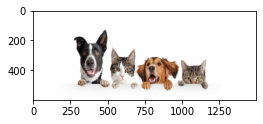

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

PATH = '/content/drive/MyDrive/AI_research/AI_INSIGHT/HW20-21/template-matching/'
height = 600
width  = 1500
image_path = PATH+'image7.jpg'

scale_level = 2
list_of_images = []

for i in range(scale_level):
  img = kimage.load_img(image_path, target_size=(height*(i+1), width*(i+1)))
  img = np.expand_dims(img, axis=0)
  list_of_images.append(img)

# check
for i in range(scale_level):
  print(list_of_images[i].shape)

plt.figure(figsize=(4,4))
plt.imshow(list_of_images[0][0])

In [ ]:
# get model
model = tf.keras.applications.VGG16(include_top=True, weights='imagenet', input_shape=(224, 224, 3))
#model.summary()

553467904/553467096 [==============================] - 4s 0us/step


In [ ]:
def compute_features(data):
  for i in range(1, 19):
    data = model.layers[i](data)
  return data

def compute_prediction(data):
  for i in range(19, 23):
    data = model.layers[i](data)
  return data

In [ ]:
# compute features for templates
list_of_features = []
for i in range(scale_level):
  features = preprocess_input(list_of_images[i])
  print(features.shape)
  features = compute_features(features)
  list_of_features.append(features)

(1, 600, 1500, 3)
(1, 1200, 3000, 3)


In [ ]:
# compute predictions
side = 7
prediction_data = []

for scale in range(scale_level):
  print('scale: ', scale)
  height_fm = list_of_features[scale].shape[1]
  width_fm  = list_of_features[scale].shape[2]
  depth_fm  = list_of_features[scale].shape[3]

  for i in range(height_fm-side+1):
    for j in range(width_fm-side+1):
      patch = list_of_features[scale][:,i:i+side,j:j+side,:]
      patch = compute_prediction(patch)
      prediction_data.append( (tf.math.reduce_max(patch[0]).numpy(), 
                               i, j, tf.math.argmax(patch[0]).numpy(), scale) )
      
print(len(prediction_data))

scale:  0
scale:  1
3177


In [ ]:
def getKey(item):
    return item[0]

pred_sorted = sorted(prediction_data, key=getKey, reverse=True)
print(pred_sorted[:3])

[(0.9574404, 22, 39, 283, 1), (0.938423, 23, 39, 283, 1), (0.9351347, 24, 38, 283, 1)]


In [ ]:
labels = np.load(PATH+'imagenet1000_clsid_to_human.pkl', allow_pickle=True)
print(type(labels))
print(labels[227])

<class 'dict'>
kelpie


In [ ]:
def IoU(coord1, coord2):
  xmin1 = coord1[1] 
  ymin1 = coord1[0]
  xmax1 = xmin1 + side
  ymax1 = ymin1 + side

  xmin2 = coord2[1] 
  ymin2 = coord2[0]
  xmax2 = xmin2 + side
  ymax2 = ymin2 + side

  inter_xmin = max(xmin1, xmin2)
  inter_ymin = max(ymin1, ymin2)
  inter_xmax = min(xmax1, xmax2)
  inter_ymax = min(ymax1, ymax2)

  if inter_ymax<=inter_ymin or inter_xmax<=inter_xmin:
    return 0
  
  inter_area = (inter_xmax-inter_xmin)*(inter_ymax-inter_ymin)
  box1_area = (xmax1-xmin1)*(ymax1-ymin1)
  box2_area = (xmax2-xmin2)*(ymax2-ymin2)
  union_area = box1_area+box2_area-inter_area

  iou = inter_area/float(union_area)
  assert 0.0<= iou <=1.0
  return iou

def check_iou(i,j,proposal_boxes):
  result = False

  coord1 = (i,j)
  
  length = len(proposal_boxes)
  rm_idx_list = []
  for k in range(length):
    coord2 = (proposal_boxes[k][1], proposal_boxes[k][2])
    iou_res = IoU(coord1, coord2)
    if (iou_res > 0.1):
        rm_idx_list.append(k)
  
  rm_idx_list = sorted(rm_idx_list, reverse=True)
  for rm_id in rm_idx_list:
    del proposal_boxes[rm_id]
  return proposal_boxes

# remove duplication
def remove_duplication(data):
  result = []

  length = len(data)
  proposal_boxes = data.copy()
  while len(proposal_boxes) > 0:
    result.append(proposal_boxes.pop(0))
    proposal_boxes = check_iou(result[-1][1], result[-1][2], proposal_boxes)
  
  return result

In [ ]:
print(len(pred_sorted))
print(pred_sorted[:3])

result = remove_duplication(pred_sorted)
print(len(result))
print(result[:3])

3177
[(0.9574404, 22, 39, 283, 1), (0.938423, 23, 39, 283, 1), (0.9351347, 24, 38, 283, 1)]
69
[(0.9574404, 22, 39, 283, 1), (0.8178097, 25, 63, 281, 1), (0.81386703, 27, 31, 283, 1)]


0.9574404 22 39 1
0.8178097 25 63 1
0.81386703 27 31 1
0.7989629 28 54 1
0.7664824 10 16 1


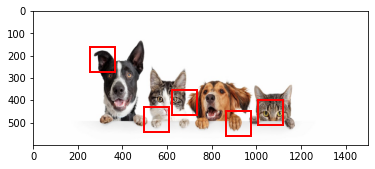

In [ ]:
# Show all with a threshold
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

im = kimage.load_img(image_path, target_size=(height, width))
scale_height = height//37
scale_width  = width//93

fig, ax = plt.subplots()
ax.imshow(im)

length = len(result)

# Create a Rectangle patch
for i in range(length):
  if (result[i][0] > 0.76 and result[i][4]==1):    
    print(result[i][0], result[i][1], result[i][2], result[i][4])
    rect = patches.Rectangle(( (result[i][2]) *scale_width,
                               (result[i][1]) *scale_height), 
                              224//2, 
                              224//2, 
                              linewidth=2, edgecolor='r', 
                              facecolor='none')
    ax.add_patch(rect)
    #plt.text(result[i][2]*scale_width-100, result[i][1]*scale_height, labels[result[i][3]])

plt.show()

## 5) (Optional) Từ source code được cung cấp cho bài toán object tracking, các bạn thiết kế lại thuật toán để giải quyết vấn đề object có thể xuất hiện với kích cỡ khác nhau.

In [ ]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity

import tensorflow as tf
from tensorflow.keras.preprocessing import image as kimage
from tensorflow.keras.applications.vgg16 import preprocess_input

In [ ]:
model = tf.keras.applications.VGG16(include_top=False, 
                                    weights='imagenet', 
                                    input_shape=(None, None, 3))
#model.summary()

58892288/58889256 [==============================] - 1s 0us/step


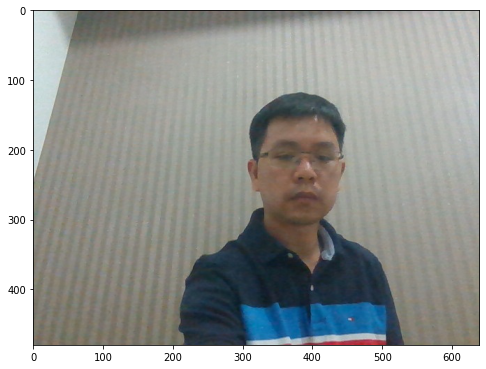

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

PATH = '/content/drive/MyDrive/AI_research/AI_INSIGHT/HW20-21/tracking_images4/'
height = 480
width  = 640
image_t1 = kimage.load_img(PATH+'img'+str(0)+'.jpg', target_size=(height, width))

plt.figure(figsize=(8,8))
plt.imshow(image_t1)

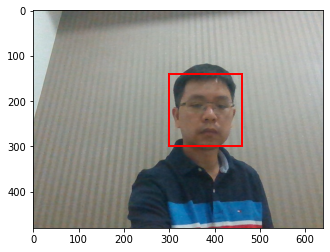

In [ ]:
# given the bounding box for an object

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

fig, ax = plt.subplots()
ax.imshow(image_t1)

x = 300
y = 140
patch_side = 160

rect = patches.Rectangle((x,y), patch_side, patch_side, 
                         linewidth=2, edgecolor='r', 
                         facecolor='none')
ax.add_patch(rect)

plt.show()

(480, 640, 3)
(160, 160, 3)


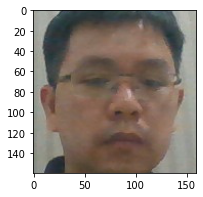

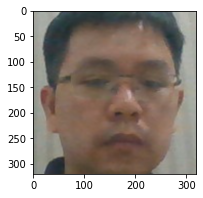

In [ ]:
import cv2
# get template
image_t1_np = kimage.img_to_array(image_t1)
print(image_t1_np.shape)

template_t1 = image_t1_np[y:y+patch_side, x:x+patch_side, :]
print(template_t1.shape)

list_template_t1 = []
scale_range = [1,2,]
for sc in scale_range:
  list_template_t1.append(cv2.resize(template_t1, (template_t1.shape[1]*sc, template_t1.shape[0]*sc)))
plt.figure(figsize=(3,3))
plt.imshow(list_template_t1[0]/255.0)
plt.figure(figsize=(3,3))
plt.imshow(list_template_t1[1]/255.0)

In [ ]:
# compute features for template_t1
list_template_t1_fm = []
for tt1 in list_template_t1:
  tt1 = np.expand_dims(tt1, axis=0)
  tt1_fm = model.predict(tt1)
  print(tt1_fm.shape)
  list_template_t1_fm.append(tt1_fm)

(1, 5, 5, 512)
(1, 10, 10, 512)


In [ ]:
def getKey(item):
    return item[0]

[(0.2583753, 1, 6, 2), (0.25048605, 2, 6, 2), (0.24296266, 2, 5, 2), (0.23795073, 1, 5, 2), (0.23666143, 3, 6, 2), (0.23399742, 0, 6, 2), (0.23275122, 3, 5, 2), (0.21406616, 4, 6, 2), (0.2049342, 0, 5, 2), (0.20068075, 4, 5, 2), (0.18478422, 5, 6, 2), (0.17950183, 2, 4, 2), (0.17773083, 3, 4, 2), (0.17213152, 5, 5, 2), (0.16943558, 1, 4, 2), (0.16739026, 4, 4, 2), (0.1592085, 4, 3, 2), (0.15727723, 5, 4, 2), (0.15701017, 5, 6, 1), (0.1531327, 5, 3, 2), (0.15057814, 0, 4, 2), (0.15032569, 3, 3, 2), (0.1398286, 4, 2, 2), (0.13917886, 4, 6, 1), (0.1356011, 2, 3, 2), (0.13517292, 5, 2, 2), (0.13489254, 6, 6, 1), (0.13233677, 3, 2, 2), (0.11917275, 1, 3, 2), (0.11760966, 2, 2, 2), (0.11320959, 0, 3, 2), (0.106218584, 0, 0, 2), (0.10272416, 5, 0, 2), (0.09956361, 1, 2, 2), (0.09788227, 5, 1, 2), (0.096962385, 0, 2, 2), (0.09636567, 5, 5, 1), (0.094391294, 6, 5, 1), (0.09238289, 3, 6, 1), (0.09209855, 0, 1, 2), (0.09062328, 2, 1, 2), (0.08657638, 3, 1, 2), (0.08624554, 4, 1, 2), (0.08598467, 

<Figure size 1152x1152 with 0 Axes>

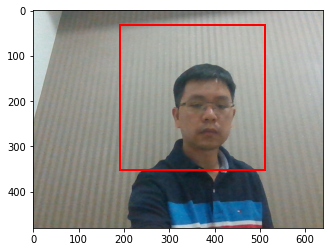

[(0.5485012, 5, 9, 1), (0.49602568, 4, 9, 1), (0.48715997, 5, 10, 1), (0.4688191, 4, 10, 1), (0.36486828, 5, 8, 1), (0.31923088, 4, 8, 1), (0.29748386, 3, 10, 1), (0.29717347, 3, 9, 1), (0.26310846, 1, 6, 2), (0.25220814, 5, 7, 1), (0.25199932, 2, 6, 2), (0.24587055, 0, 6, 2), (0.2454545, 2, 5, 2), (0.24341354, 1, 5, 2), (0.23741677, 1, 7, 2), (0.23344958, 3, 5, 2), (0.23268308, 3, 6, 2), (0.22964078, 4, 8, 2), (0.22785334, 3, 8, 2), (0.22774531, 2, 7, 2), (0.22529425, 0, 7, 2), (0.22512423, 2, 8, 2), (0.22029446, 0, 5, 2), (0.21780504, 4, 7, 1), (0.2173408, 1, 8, 2), (0.21643248, 4, 6, 2), (0.21461989, 3, 7, 2), (0.21340443, 4, 7, 2), (0.21297331, 4, 9, 2), (0.21032228, 3, 9, 2), (0.2100118, 4, 5, 2), (0.20839757, 3, 8, 1), (0.20195842, 0, 8, 2), (0.1990332, 5, 8, 2), (0.19706123, 5, 7, 2), (0.19467889, 5, 6, 2), (0.19420506, 2, 9, 2), (0.18553379, 5, 5, 2), (0.18398288, 2, 9, 1), (0.18345322, 2, 10, 1), (0.1824905, 5, 9, 2), (0.18193081, 2, 4, 2), (0.18120427, 3, 4, 2), (0.17590904, 

<Figure size 1152x1152 with 0 Axes>

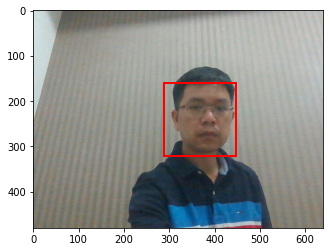

[(0.5547496, 5, 9, 1), (0.48441267, 4, 9, 1), (0.47607535, 5, 10, 1), (0.45093775, 4, 10, 1), (0.3831506, 5, 8, 1), (0.365909, 6, 9, 1), (0.32596225, 4, 8, 1), (0.3026213, 6, 10, 1), (0.2965536, 4, 11, 1), (0.28993312, 6, 8, 1), (0.28845483, 5, 11, 1), (0.28590727, 3, 10, 1), (0.28073263, 3, 9, 1), (0.25954804, 5, 7, 1), (0.2537362, 1, 6, 2), (0.2478735, 4, 12, 1), (0.24695976, 2, 5, 2), (0.24403603, 2, 6, 2), (0.24243015, 1, 5, 2), (0.23603196, 3, 5, 2), (0.23211005, 7, 9, 1), (0.22948109, 4, 8, 2), (0.22532703, 3, 8, 2), (0.224069, 5, 12, 1), (0.22239587, 3, 6, 2), (0.2222487, 4, 5, 2), (0.22179459, 1, 7, 2), (0.2215773, 2, 8, 2), (0.22064568, 2, 7, 2), (0.21876547, 4, 7, 1), (0.21773584, 4, 6, 2), (0.21591154, 4, 9, 2), (0.21543844, 6, 7, 1), (0.21495692, 3, 11, 1), (0.21338336, 3, 9, 2), (0.21067128, 4, 7, 2), (0.20478831, 3, 7, 2), (0.2036704, 6, 11, 1), (0.2016522, 5, 8, 2), (0.20099524, 1, 8, 2), (0.19993505, 3, 8, 1), (0.19870399, 5, 6, 2), (0.19741717, 5, 7, 2), (0.19614397, 5

<Figure size 1152x1152 with 0 Axes>

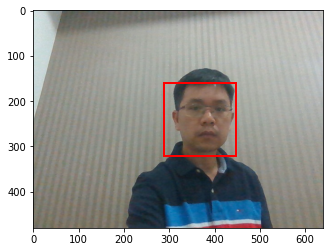

[(0.5498565, 5, 9, 1), (0.4862863, 4, 9, 1), (0.47948834, 5, 10, 1), (0.45933568, 4, 10, 1), (0.37478644, 5, 8, 1), (0.3555774, 6, 9, 1), (0.31756958, 4, 8, 1), (0.30455843, 6, 10, 1), (0.2989629, 4, 11, 1), (0.29040727, 5, 11, 1), (0.28516537, 3, 10, 1), (0.27895424, 3, 9, 1), (0.2749091, 6, 8, 1), (0.2638653, 5, 7, 1), (0.24531622, 1, 6, 2), (0.24027222, 2, 6, 2), (0.23773877, 4, 12, 1), (0.23345093, 2, 5, 2), (0.23022635, 1, 5, 2), (0.22678751, 3, 5, 2), (0.22130449, 5, 12, 1), (0.21850789, 3, 6, 2), (0.21635039, 4, 7, 1), (0.21451068, 2, 7, 2), (0.21352953, 1, 7, 2), (0.21303989, 7, 9, 1), (0.21200284, 4, 5, 2), (0.21031143, 6, 7, 1), (0.20887153, 4, 6, 2), (0.20679908, 4, 8, 2), (0.20645604, 3, 11, 1), (0.20460886, 6, 11, 1), (0.20442031, 2, 8, 2), (0.20165181, 3, 8, 2), (0.2006415, 4, 9, 2), (0.19545998, 4, 7, 2), (0.19283827, 3, 7, 2), (0.19254181, 3, 9, 2), (0.18997, 5, 6, 2), (0.1885359, 3, 8, 1), (0.18836723, 7, 10, 1), (0.18835033, 5, 7, 2), (0.18789427, 5, 5, 2), (0.1876478

<Figure size 1152x1152 with 0 Axes>

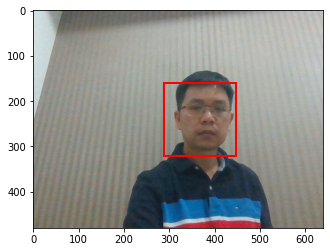

[(0.52950025, 5, 9, 1), (0.4892053, 5, 10, 1), (0.44182053, 4, 10, 1), (0.4384135, 4, 9, 1), (0.35437903, 6, 9, 1), (0.34161478, 5, 8, 1), (0.31468183, 6, 10, 1), (0.29538953, 5, 11, 1), (0.2919258, 4, 11, 1), (0.28652105, 3, 10, 1), (0.2745007, 4, 8, 1), (0.26232678, 6, 8, 1), (0.26206362, 3, 9, 1), (0.24648209, 1, 6, 2), (0.24292096, 5, 7, 1), (0.23179553, 4, 12, 1), (0.23058055, 2, 6, 2), (0.22798736, 1, 5, 2), (0.22405644, 2, 5, 2), (0.22295715, 5, 12, 1), (0.21321853, 1, 7, 2), (0.21285312, 7, 9, 1), (0.21030064, 3, 5, 2), (0.20509204, 3, 11, 1), (0.20406808, 6, 11, 1), (0.20302868, 3, 6, 2), (0.20241351, 2, 7, 2), (0.20026366, 6, 7, 1), (0.19638935, 4, 6, 2), (0.19576824, 4, 7, 1), (0.19425629, 4, 5, 2), (0.19357407, 4, 9, 2), (0.19062914, 2, 10, 1), (0.19027995, 7, 10, 1), (0.19027777, 5, 7, 2), (0.18935204, 5, 6, 2), (0.18916629, 4, 8, 2), (0.1886108, 2, 8, 2), (0.1875871, 3, 9, 2), (0.18443392, 4, 7, 2), (0.18392755, 5, 8, 2), (0.18190177, 3, 8, 2), (0.1784361, 2, 9, 1), (0.17

<Figure size 1152x1152 with 0 Axes>

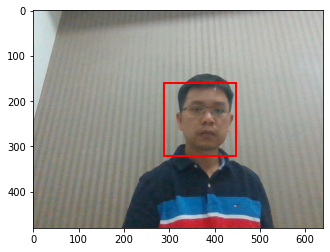

[(0.5053778, 5, 9, 1), (0.47230786, 5, 10, 1), (0.40451878, 4, 10, 1), (0.39841682, 4, 9, 1), (0.34805524, 6, 9, 1), (0.3312118, 5, 8, 1), (0.30692422, 6, 10, 1), (0.27779055, 5, 11, 1), (0.2605486, 4, 8, 1), (0.25946423, 3, 10, 1), (0.25888735, 4, 11, 1), (0.25868726, 6, 8, 1), (0.24119118, 3, 9, 1), (0.22815786, 5, 7, 1), (0.21589848, 5, 12, 1), (0.20821075, 4, 12, 1), (0.20191255, 1, 6, 2), (0.20043145, 2, 6, 2), (0.1958567, 7, 9, 1), (0.19045518, 1, 5, 2), (0.18960096, 2, 5, 2), (0.18827875, 5, 6, 2), (0.18801366, 6, 11, 1), (0.18791473, 6, 7, 1), (0.18109667, 3, 11, 1), (0.18107034, 3, 6, 2), (0.18079615, 3, 5, 2), (0.1801627, 4, 6, 2), (0.17989165, 5, 5, 2), (0.17983727, 4, 5, 2), (0.17961273, 2, 7, 2), (0.17769961, 4, 7, 1), (0.17665079, 5, 7, 2), (0.17567655, 1, 7, 2), (0.17486085, 7, 10, 1), (0.17064755, 5, 8, 2), (0.1703883, 4, 9, 2), (0.16943033, 2, 10, 1), (0.16712397, 4, 8, 2), (0.16466522, 4, 7, 2), (0.1643056, 7, 8, 1), (0.1634638, 5, 9, 2), (0.16312802, 2, 8, 2), (0.161

<Figure size 1152x1152 with 0 Axes>

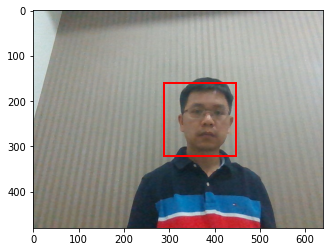

[(0.501577, 5, 9, 1), (0.48447615, 5, 10, 1), (0.37501764, 4, 10, 1), (0.37036422, 4, 9, 1), (0.37034783, 6, 9, 1), (0.34395415, 6, 10, 1), (0.3272411, 5, 8, 1), (0.29714566, 5, 11, 1), (0.26062894, 6, 8, 1), (0.24990661, 4, 8, 1), (0.23802668, 3, 10, 1), (0.23692681, 5, 12, 1), (0.23655243, 4, 11, 1), (0.22971301, 5, 7, 1), (0.22955889, 3, 9, 1), (0.22811718, 1, 6, 2), (0.21972366, 2, 6, 2), (0.21762773, 7, 9, 1), (0.21343522, 6, 11, 1), (0.21336813, 1, 5, 2), (0.20488633, 2, 5, 2), (0.20369399, 5, 6, 2), (0.1987672, 3, 6, 2), (0.19806863, 3, 5, 2), (0.1949097, 7, 10, 1), (0.19468626, 4, 12, 1), (0.19465517, 2, 7, 2), (0.19457644, 5, 5, 2), (0.19434565, 4, 5, 2), (0.19397472, 4, 6, 2), (0.19058979, 1, 7, 2), (0.18732175, 6, 7, 1), (0.1833371, 5, 7, 2), (0.178533, 5, 8, 2), (0.17649749, 5, 9, 2), (0.17527124, 4, 7, 1), (0.1726828, 3, 7, 2), (0.16883463, 7, 8, 1), (0.16846906, 4, 7, 2), (0.16840231, 2, 8, 2), (0.1657936, 4, 9, 2), (0.16444136, 6, 12, 1), (0.16398197, 3, 8, 1), (0.161777

<Figure size 1152x1152 with 0 Axes>

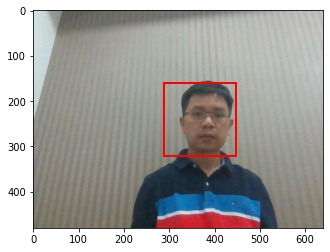

[(0.47841543, 5, 10, 1), (0.45819885, 5, 9, 1), (0.41602653, 6, 9, 1), (0.40919954, 6, 10, 1), (0.32283306, 4, 10, 1), (0.29809004, 5, 11, 1), (0.2979836, 4, 9, 1), (0.28908157, 5, 8, 1), (0.2801119, 6, 8, 1), (0.25089994, 7, 9, 1), (0.24710284, 6, 11, 1), (0.23189448, 5, 12, 1), (0.23126234, 2, 6, 2), (0.23066308, 1, 6, 2), (0.22956066, 7, 10, 1), (0.21227926, 2, 7, 2), (0.21125062, 4, 11, 1), (0.21061218, 3, 6, 2), (0.20842056, 1, 5, 2), (0.20370889, 2, 5, 2), (0.20348392, 3, 10, 1), (0.19935998, 5, 6, 2), (0.19731098, 7, 8, 1), (0.19679542, 4, 8, 1), (0.19520831, 5, 7, 1), (0.19492054, 1, 7, 2), (0.19483525, 6, 7, 1), (0.192887, 3, 7, 2), (0.19284831, 3, 5, 2), (0.19123082, 3, 9, 1), (0.18926276, 5, 5, 2), (0.1878698, 4, 6, 2), (0.1850137, 6, 12, 1), (0.18481243, 5, 7, 2), (0.18282437, 5, 9, 2), (0.18124133, 5, 8, 2), (0.17989413, 4, 5, 2), (0.17559251, 2, 8, 2), (0.17169711, 3, 8, 2), (0.17065054, 3, 9, 2), (0.17029485, 4, 12, 1), (0.1700013, 4, 7, 2), (0.16972603, 4, 9, 2), (0.163

<Figure size 1152x1152 with 0 Axes>

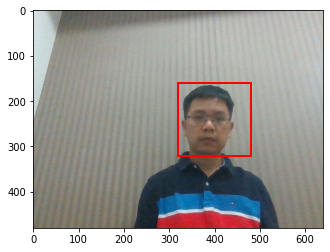

[(0.4331716, 5, 10, 1), (0.3980374, 5, 9, 1), (0.38785174, 6, 10, 1), (0.36752155, 6, 9, 1), (0.3057287, 4, 10, 1), (0.2822128, 4, 9, 1), (0.27454427, 5, 11, 1), (0.27074987, 5, 8, 1), (0.25437027, 6, 8, 1), (0.24229726, 6, 11, 1), (0.2403874, 7, 9, 1), (0.2310694, 7, 10, 1), (0.2151608, 5, 12, 1), (0.20011447, 1, 6, 2), (0.19655682, 3, 10, 1), (0.19502285, 4, 8, 1), (0.19346152, 4, 11, 1), (0.19066942, 2, 6, 2), (0.19051622, 5, 6, 2), (0.18952973, 7, 8, 1), (0.18683814, 3, 9, 1), (0.18437797, 6, 12, 1), (0.18376742, 5, 7, 1), (0.18141869, 3, 6, 2), (0.18017657, 2, 7, 2), (0.1772009, 4, 6, 2), (0.17556743, 5, 7, 2), (0.17229567, 3, 7, 2), (0.17213236, 6, 7, 1), (0.17178215, 1, 7, 2), (0.164269, 5, 8, 2), (0.16420531, 5, 9, 2), (0.1630714, 4, 7, 2), (0.1531471, 3, 8, 2), (0.15183744, 4, 12, 1), (0.15014637, 8, 9, 1), (0.14961864, 7, 11, 1), (0.14901546, 2, 8, 2), (0.14760812, 4, 8, 2), (0.14737083, 5, 10, 2), (0.14653865, 3, 9, 2), (0.14628427, 4, 9, 2), (0.14061402, 8, 10, 1), (0.13189

<Figure size 1152x1152 with 0 Axes>

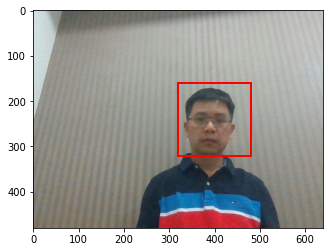

[(0.4800463, 5, 10, 1), (0.4650913, 6, 10, 1), (0.39007232, 6, 9, 1), (0.3834952, 5, 9, 1), (0.30202404, 5, 11, 1), (0.30140954, 4, 10, 1), (0.2877764, 6, 11, 1), (0.27020255, 7, 10, 1), (0.2630441, 6, 8, 1), (0.25434843, 7, 9, 1), (0.2543299, 5, 8, 1), (0.23549192, 4, 9, 1), (0.22054978, 5, 12, 1), (0.20844233, 6, 12, 1), (0.2060404, 2, 6, 2), (0.20557573, 2, 7, 2), (0.20165306, 1, 6, 2), (0.19970402, 4, 11, 1), (0.19654238, 7, 8, 1), (0.19420005, 3, 7, 2), (0.19313028, 3, 6, 2), (0.19088976, 3, 10, 1), (0.18426591, 1, 7, 2), (0.17812164, 4, 6, 2), (0.17655599, 5, 6, 2), (0.17378041, 5, 9, 2), (0.1719054, 7, 11, 1), (0.17136405, 4, 7, 2), (0.16941956, 5, 7, 2), (0.16833921, 6, 7, 1), (0.16669983, 5, 8, 2), (0.1635724, 2, 8, 2), (0.16321813, 4, 8, 1), (0.16251545, 5, 10, 2), (0.16204153, 3, 8, 2), (0.15629144, 5, 7, 1), (0.15406908, 4, 8, 2), (0.15192965, 4, 9, 2), (0.14796203, 3, 9, 1), (0.14735435, 3, 9, 2), (0.1466861, 4, 12, 1), (0.1422564, 2, 9, 2), (0.14076468, 5, 13, 1), (0.1404

<Figure size 1152x1152 with 0 Axes>

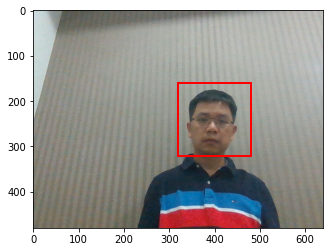

[(0.46556312, 5, 10, 1), (0.45133263, 6, 10, 1), (0.33563474, 5, 9, 1), (0.3350405, 6, 9, 1), (0.31462428, 5, 11, 1), (0.31099185, 4, 10, 1), (0.30204797, 6, 11, 1), (0.2698834, 7, 10, 1), (0.23085895, 4, 9, 1), (0.22667088, 7, 9, 1), (0.2263496, 5, 12, 1), (0.22176592, 5, 8, 1), (0.22174712, 6, 8, 1), (0.22132038, 6, 12, 1), (0.21788345, 4, 11, 1), (0.20062412, 3, 10, 1), (0.19434185, 2, 7, 2), (0.19063343, 1, 6, 2), (0.18785365, 2, 6, 2), (0.18466125, 7, 11, 1), (0.17965767, 3, 7, 2), (0.17948735, 1, 7, 2), (0.1748845, 5, 9, 2), (0.17484717, 7, 8, 1), (0.17168486, 5, 10, 2), (0.17113546, 5, 6, 2), (0.16912165, 3, 6, 2), (0.16737613, 5, 7, 2), (0.16609743, 5, 8, 2), (0.1624672, 2, 8, 2), (0.16097398, 4, 6, 2), (0.15993586, 4, 8, 1), (0.15937094, 3, 8, 2), (0.1592145, 4, 7, 2), (0.15793364, 6, 13, 1), (0.15445785, 5, 13, 1), (0.15227665, 8, 10, 1), (0.15144387, 3, 9, 1), (0.15125221, 3, 11, 1), (0.1510453, 4, 12, 1), (0.14651382, 2, 9, 2), (0.14644593, 3, 9, 2), (0.14552154, 4, 8, 2), 

<Figure size 1152x1152 with 0 Axes>

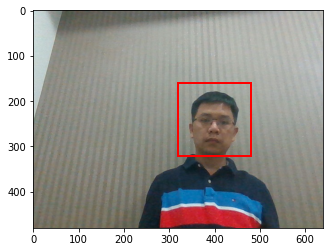

[(0.4650026, 6, 10, 1), (0.4617324, 5, 10, 1), (0.3483782, 6, 9, 1), (0.32697105, 5, 9, 1), (0.30969778, 5, 11, 1), (0.30606115, 6, 11, 1), (0.29880518, 4, 10, 1), (0.27440205, 7, 10, 1), (0.23880914, 7, 9, 1), (0.23249549, 6, 8, 1), (0.22084214, 5, 12, 1), (0.21912609, 6, 12, 1), (0.21556324, 5, 8, 1), (0.21317933, 4, 11, 1), (0.21120912, 4, 9, 1), (0.19139837, 2, 7, 2), (0.19001237, 3, 10, 1), (0.18984467, 7, 8, 1), (0.18895788, 1, 6, 2), (0.18440151, 2, 6, 2), (0.18278845, 7, 11, 1), (0.17820583, 1, 7, 2), (0.1776286, 3, 7, 2), (0.17583421, 5, 6, 2), (0.17544308, 5, 9, 2), (0.1704837, 3, 6, 2), (0.17028525, 5, 10, 2), (0.16863614, 5, 7, 2), (0.16676201, 5, 8, 2), (0.16549958, 4, 6, 2), (0.16189796, 2, 8, 2), (0.15950136, 4, 7, 2), (0.15377761, 3, 8, 2), (0.14691328, 3, 11, 1), (0.1468939, 4, 12, 1), (0.14565492, 6, 13, 1), (0.14461476, 8, 10, 1), (0.14332277, 2, 9, 2), (0.14238052, 8, 9, 1), (0.14145939, 4, 8, 2), (0.1408768, 4, 8, 1), (0.14057371, 5, 13, 1), (0.14032869, 3, 9, 2), 

<Figure size 1152x1152 with 0 Axes>

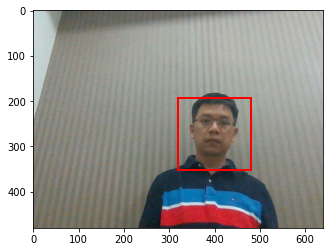

[(0.46413884, 6, 10, 1), (0.4591784, 5, 10, 1), (0.36201724, 6, 9, 1), (0.34417558, 5, 9, 1), (0.30115965, 4, 10, 1), (0.29257506, 6, 11, 1), (0.28917807, 5, 11, 1), (0.2849569, 7, 10, 1), (0.24838021, 7, 9, 1), (0.22981225, 6, 8, 1), (0.22827883, 4, 9, 1), (0.22156286, 5, 8, 1), (0.21059902, 2, 7, 2), (0.20474519, 6, 12, 1), (0.20422666, 2, 6, 2), (0.19965601, 4, 11, 1), (0.19679582, 5, 12, 1), (0.19206668, 3, 10, 1), (0.18642642, 7, 11, 1), (0.1838524, 7, 8, 1), (0.18164906, 3, 7, 2), (0.17522189, 3, 6, 2), (0.16910513, 2, 8, 2), (0.16682965, 5, 9, 2), (0.16378725, 5, 10, 2), (0.15996481, 10, 8, 1), (0.15866219, 5, 6, 2), (0.15848939, 10, 12, 1), (0.15822072, 8, 10, 1), (0.15663555, 4, 6, 2), (0.15635955, 3, 8, 2), (0.15591797, 10, 9, 1), (0.15457417, 8, 9, 1), (0.15290299, 4, 8, 1), (0.15243435, 5, 8, 2), (0.15006663, 10, 11, 1), (0.14940149, 4, 7, 2), (0.14873546, 5, 7, 2), (0.14508277, 3, 9, 1), (0.14167567, 3, 9, 2), (0.13982156, 10, 13, 1), (0.13815269, 4, 9, 2), (0.13733137, 3,

<Figure size 1152x1152 with 0 Axes>

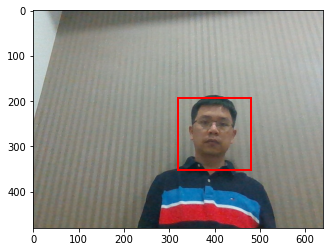

[(0.45098758, 6, 10, 1), (0.4214331, 5, 10, 1), (0.37632173, 6, 9, 1), (0.3475054, 5, 9, 1), (0.28799972, 7, 10, 1), (0.28314802, 6, 11, 1), (0.27007246, 4, 10, 1), (0.26470128, 7, 9, 1), (0.2599585, 5, 11, 1), (0.25192496, 6, 8, 1), (0.23769656, 5, 8, 1), (0.2278927, 4, 9, 1), (0.2122072, 2, 7, 2), (0.21129505, 6, 12, 1), (0.20812044, 2, 6, 2), (0.20336443, 7, 8, 1), (0.18965554, 3, 7, 2), (0.18887682, 7, 11, 1), (0.18709691, 5, 12, 1), (0.1832461, 3, 6, 2), (0.17441292, 3, 10, 1), (0.17088008, 5, 9, 2), (0.17044261, 4, 11, 1), (0.17025295, 4, 6, 2), (0.16936727, 2, 8, 2), (0.16826919, 10, 8, 1), (0.16821052, 8, 10, 1), (0.16814607, 5, 6, 2), (0.16718726, 8, 9, 1), (0.16528255, 4, 7, 2), (0.16476662, 10, 9, 1), (0.16293962, 3, 8, 2), (0.16216536, 5, 8, 2), (0.1617278, 5, 10, 2), (0.16056691, 5, 7, 2), (0.16030227, 4, 8, 1), (0.15842545, 10, 12, 1), (0.155542, 6, 7, 1), (0.15335248, 10, 11, 1), (0.15018877, 4, 8, 2), (0.14802699, 8, 8, 1), (0.14428137, 4, 9, 2), (0.14372735, 3, 9, 2), 

<Figure size 1152x1152 with 0 Axes>

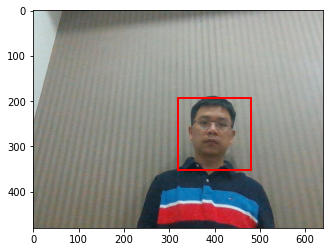

[(0.4269763, 6, 10, 1), (0.4115042, 5, 10, 1), (0.37463662, 6, 9, 1), (0.35160384, 5, 9, 1), (0.26732966, 7, 10, 1), (0.26324153, 4, 10, 1), (0.2609277, 6, 11, 1), (0.25141853, 7, 9, 1), (0.2445643, 5, 11, 1), (0.24421038, 6, 8, 1), (0.23390552, 5, 8, 1), (0.22279342, 4, 9, 1), (0.19739786, 2, 7, 2), (0.19408199, 2, 6, 2), (0.18707205, 7, 8, 1), (0.18687782, 6, 12, 1), (0.17377368, 7, 11, 1), (0.16969448, 5, 12, 1), (0.16529977, 3, 7, 2), (0.16512099, 3, 10, 1), (0.1634599, 10, 8, 1), (0.16169752, 4, 11, 1), (0.1612308, 3, 6, 2), (0.1606066, 5, 9, 2), (0.15967178, 5, 6, 2), (0.15687747, 2, 8, 2), (0.15514632, 10, 9, 1), (0.15511298, 10, 11, 1), (0.15423188, 10, 12, 1), (0.15396097, 8, 9, 1), (0.15324786, 5, 8, 2), (0.15298049, 4, 8, 1), (0.15287146, 8, 10, 1), (0.1519852, 6, 7, 1), (0.15140742, 5, 10, 2), (0.149641, 4, 6, 2), (0.1488647, 5, 7, 2), (0.143562, 3, 8, 2), (0.14148577, 4, 7, 2), (0.13872194, 5, 7, 1), (0.13616818, 3, 9, 1), (0.13581319, 10, 10, 1), (0.13552803, 10, 7, 1), (

<Figure size 1152x1152 with 0 Axes>

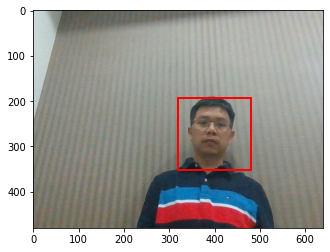

[(0.40407145, 6, 10, 1), (0.38634303, 6, 9, 1), (0.36724827, 5, 10, 1), (0.3399137, 5, 9, 1), (0.26265687, 6, 8, 1), (0.2598212, 7, 10, 1), (0.25974956, 7, 9, 1), (0.24142896, 6, 11, 1), (0.23829131, 5, 8, 1), (0.22031714, 5, 11, 1), (0.21890761, 4, 10, 1), (0.20478831, 2, 6, 2), (0.20365044, 7, 8, 1), (0.19954935, 2, 7, 2), (0.19292624, 4, 9, 1), (0.18323167, 6, 12, 1), (0.17019013, 10, 8, 1), (0.16894141, 3, 7, 2), (0.16782402, 5, 12, 1), (0.16766292, 7, 11, 1), (0.16545667, 3, 6, 2), (0.16257803, 5, 9, 2), (0.16220707, 8, 9, 1), (0.16218436, 10, 9, 1), (0.16129795, 6, 7, 1), (0.16019195, 8, 10, 1), (0.1551261, 5, 8, 2), (0.15511274, 5, 6, 2), (0.15177341, 5, 7, 1), (0.14801635, 2, 8, 2), (0.1474216, 5, 10, 2), (0.14738604, 5, 7, 2), (0.1441257, 4, 6, 2), (0.14321427, 10, 11, 1), (0.14291537, 4, 8, 1), (0.14245418, 3, 10, 1), (0.14213425, 3, 8, 2), (0.1410603, 8, 8, 1), (0.14098406, 4, 7, 2), (0.14089665, 9, 9, 1), (0.14062087, 4, 11, 1), (0.13958944, 10, 10, 1), (0.13956738, 10, 7, 

<Figure size 1152x1152 with 0 Axes>

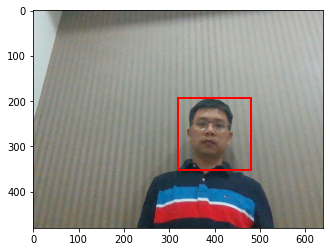

[(0.39877722, 6, 9, 1), (0.39413667, 6, 10, 1), (0.355628, 5, 10, 1), (0.34822327, 5, 9, 1), (0.26865038, 7, 9, 1), (0.26681846, 6, 8, 1), (0.26475698, 7, 10, 1), (0.23655286, 5, 8, 1), (0.23504771, 6, 11, 1), (0.22252846, 4, 10, 1), (0.21023591, 5, 11, 1), (0.20365344, 4, 9, 1), (0.20271568, 7, 8, 1), (0.18233332, 2, 6, 2), (0.18221697, 6, 12, 1), (0.17818171, 2, 7, 2), (0.17698807, 10, 8, 1), (0.17256305, 7, 11, 1), (0.1683631, 8, 9, 1), (0.16621016, 6, 7, 1), (0.16252953, 10, 9, 1), (0.16064088, 8, 10, 1), (0.1605734, 5, 12, 1), (0.15793791, 3, 7, 2), (0.15418833, 3, 6, 2), (0.15044628, 5, 7, 1), (0.14846994, 5, 9, 2), (0.14721711, 9, 9, 1), (0.14682388, 5, 6, 2), (0.14359467, 8, 8, 1), (0.14301504, 5, 8, 2), (0.14022414, 4, 8, 1), (0.13884622, 4, 11, 1), (0.13830735, 10, 7, 1), (0.13791336, 9, 8, 1), (0.13783066, 7, 7, 1), (0.13694207, 4, 6, 2), (0.1366787, 2, 8, 2), (0.13630752, 3, 10, 1), (0.1361546, 5, 7, 2), (0.13562785, 10, 10, 1), (0.13424948, 10, 11, 1), (0.13383098, 5, 10, 

<Figure size 1152x1152 with 0 Axes>

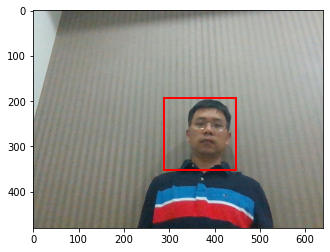

[(0.38948765, 6, 9, 1), (0.3766507, 6, 10, 1), (0.34983623, 5, 9, 1), (0.34373295, 5, 10, 1), (0.2601765, 7, 9, 1), (0.25749013, 7, 10, 1), (0.25746423, 6, 8, 1), (0.23534219, 5, 8, 1), (0.23267597, 6, 11, 1), (0.21537298, 4, 10, 1), (0.20666836, 5, 11, 1), (0.20148289, 4, 9, 1), (0.18775733, 7, 8, 1), (0.17959589, 2, 7, 2), (0.17764589, 7, 11, 1), (0.1773654, 2, 6, 2), (0.17523938, 6, 12, 1), (0.17295368, 10, 8, 1), (0.16579, 6, 7, 1), (0.16438264, 8, 10, 1), (0.16403444, 8, 9, 1), (0.15899237, 5, 12, 1), (0.15832941, 3, 7, 2), (0.15543404, 5, 7, 1), (0.15285118, 10, 9, 1), (0.15117775, 3, 6, 2), (0.14931414, 2, 5, 2), (0.14742792, 2, 8, 2), (0.1461119, 10, 11, 1), (0.14519455, 5, 9, 2), (0.1403616, 5, 5, 2), (0.14027774, 10, 7, 1), (0.13965888, 10, 10, 1), (0.13908593, 5, 8, 2), (0.13859767, 5, 6, 2), (0.13850378, 9, 9, 1), (0.13844104, 4, 8, 1), (0.13746227, 3, 8, 2), (0.1358227, 10, 12, 1), (0.13500269, 5, 10, 2), (0.13475949, 8, 8, 1), (0.13303694, 8, 11, 1), (0.13297021, 4, 11, 1

<Figure size 1152x1152 with 0 Axes>

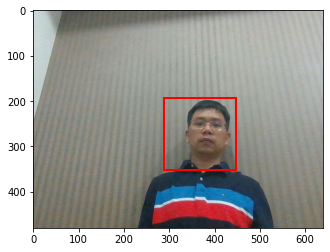

[(0.3879086, 6, 9, 1), (0.36456457, 5, 9, 1), (0.3601327, 6, 10, 1), (0.33621964, 5, 10, 1), (0.25966927, 7, 9, 1), (0.25930187, 6, 8, 1), (0.24946314, 5, 8, 1), (0.24845813, 7, 10, 1), (0.23042953, 4, 10, 1), (0.22692636, 4, 9, 1), (0.22158717, 6, 11, 1), (0.19471888, 5, 11, 1), (0.18983959, 7, 8, 1), (0.18121365, 6, 7, 1), (0.1797472, 2, 6, 2), (0.17835146, 5, 7, 1), (0.17708935, 2, 7, 2), (0.17498809, 6, 12, 1), (0.17375113, 10, 8, 1), (0.17062238, 7, 11, 1), (0.16930933, 8, 9, 1), (0.1644181, 8, 10, 1), (0.16141309, 4, 8, 1), (0.16120286, 10, 9, 1), (0.15319881, 5, 12, 1), (0.15149553, 2, 5, 2), (0.15085252, 3, 7, 2), (0.14884758, 3, 6, 2), (0.1465354, 5, 9, 2), (0.14626619, 10, 10, 1), (0.14442308, 10, 11, 1), (0.14336419, 3, 10, 1), (0.1432366, 9, 9, 1), (0.14257012, 5, 5, 2), (0.14153928, 5, 8, 2), (0.14087221, 2, 8, 2), (0.14044046, 5, 6, 2), (0.1394812, 4, 11, 1), (0.13905789, 7, 7, 1), (0.13724254, 10, 7, 1), (0.13560669, 9, 10, 1), (0.13443376, 8, 8, 1), (0.13307582, 5, 7, 2

<Figure size 1152x1152 with 0 Axes>

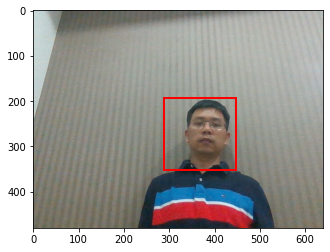

[(0.40296116, 6, 9, 1), (0.38750622, 6, 10, 1), (0.36783862, 5, 9, 1), (0.36364427, 5, 10, 1), (0.27821562, 7, 9, 1), (0.27728736, 6, 8, 1), (0.2630222, 7, 10, 1), (0.26001173, 5, 8, 1), (0.2352399, 4, 10, 1), (0.22278214, 4, 9, 1), (0.22019367, 6, 11, 1), (0.2124208, 7, 8, 1), (0.20384857, 5, 11, 1), (0.20122688, 2, 6, 2), (0.19292025, 2, 7, 2), (0.18896455, 6, 7, 1), (0.17697272, 5, 7, 1), (0.17289262, 8, 9, 1), (0.17104569, 6, 12, 1), (0.16548057, 2, 5, 2), (0.16448489, 8, 10, 1), (0.16397561, 7, 11, 1), (0.16276895, 10, 8, 1), (0.16215158, 3, 7, 2), (0.16213246, 3, 6, 2), (0.16163535, 4, 8, 1), (0.15660945, 5, 9, 2), (0.15623052, 5, 12, 1), (0.1513469, 7, 7, 1), (0.14842615, 10, 9, 1), (0.14643764, 5, 8, 2), (0.14523312, 2, 8, 2), (0.14422725, 10, 11, 1), (0.14389864, 3, 10, 1), (0.14265938, 8, 8, 1), (0.14134967, 5, 5, 2), (0.1413182, 5, 6, 2), (0.13937858, 4, 11, 1), (0.13882774, 5, 10, 2), (0.13837422, 10, 7, 1), (0.13751538, 10, 10, 1), (0.1368659, 4, 6, 2), (0.13659348, 3, 8, 

<Figure size 1152x1152 with 0 Axes>

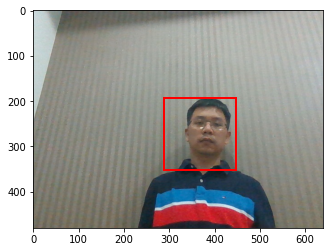

[(0.4064261, 6, 10, 1), (0.38784987, 5, 10, 1), (0.38051197, 6, 9, 1), (0.36008164, 5, 9, 1), (0.25865212, 7, 10, 1), (0.2574853, 6, 8, 1), (0.25591046, 7, 9, 1), (0.24972846, 5, 8, 1), (0.2466369, 6, 11, 1), (0.24379192, 4, 10, 1), (0.23488866, 5, 11, 1), (0.22888216, 4, 9, 1), (0.19842403, 7, 8, 1), (0.192746, 2, 6, 2), (0.1898805, 6, 12, 1), (0.18950963, 2, 7, 2), (0.18317722, 5, 12, 1), (0.17341709, 6, 7, 1), (0.17170863, 3, 7, 2), (0.16919886, 4, 8, 1), (0.16820377, 3, 6, 2), (0.16663241, 5, 7, 1), (0.16348155, 7, 11, 1), (0.16212651, 2, 5, 2), (0.15485232, 8, 9, 1), (0.15381157, 3, 10, 1), (0.15340756, 5, 6, 2), (0.15331057, 5, 9, 2), (0.15225737, 8, 10, 1), (0.15127541, 4, 11, 1), (0.14957759, 2, 8, 2), (0.1495179, 5, 8, 2), (0.149149, 10, 11, 1), (0.14894366, 3, 8, 2), (0.14810403, 4, 6, 2), (0.14775471, 10, 8, 1), (0.14689231, 5, 7, 2), (0.14401643, 4, 7, 2), (0.14378262, 3, 5, 2), (0.14281574, 5, 10, 2), (0.14160176, 10, 12, 1), (0.14141992, 5, 5, 2), (0.14082377, 3, 9, 1), (

<Figure size 1152x1152 with 0 Axes>

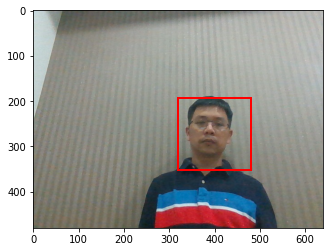

[(0.43343243, 6, 10, 1), (0.41855875, 5, 10, 1), (0.39307615, 6, 9, 1), (0.36857495, 5, 9, 1), (0.26732332, 7, 10, 1), (0.2659932, 4, 10, 1), (0.26532346, 7, 9, 1), (0.26320606, 6, 8, 1), (0.2612919, 6, 11, 1), (0.25245067, 5, 11, 1), (0.24611796, 5, 8, 1), (0.22691828, 4, 9, 1), (0.20895906, 7, 8, 1), (0.19303977, 2, 6, 2), (0.19253813, 2, 7, 2), (0.18956955, 6, 12, 1), (0.18634059, 5, 12, 1), (0.17964976, 3, 7, 2), (0.17795715, 3, 6, 2), (0.1749251, 3, 10, 1), (0.17187074, 6, 7, 1), (0.16761312, 4, 11, 1), (0.1675242, 7, 11, 1), (0.15862152, 5, 9, 2), (0.15840423, 5, 7, 1), (0.15714064, 4, 8, 1), (0.15574294, 5, 6, 2), (0.15545523, 2, 8, 2), (0.15529543, 4, 6, 2), (0.15453748, 3, 8, 2), (0.15350264, 5, 10, 2), (0.15272649, 8, 9, 1), (0.15150921, 10, 8, 1), (0.15093768, 5, 7, 2), (0.15067272, 5, 8, 2), (0.14753461, 4, 7, 2), (0.14708145, 8, 10, 1), (0.13983455, 3, 9, 1), (0.13973287, 10, 11, 1), (0.13847296, 8, 8, 1), (0.13779253, 3, 9, 2), (0.13657571, 7, 7, 1), (0.13644512, 10, 12, 

<Figure size 1152x1152 with 0 Axes>

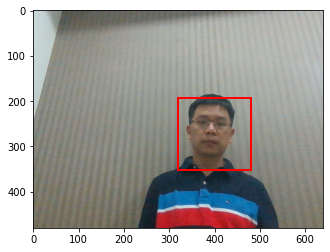

[(0.470997, 5, 10, 1), (0.43842262, 6, 10, 1), (0.40328696, 5, 9, 1), (0.38862103, 6, 9, 1), (0.32183218, 4, 10, 1), (0.2853689, 5, 11, 1), (0.27031237, 5, 8, 1), (0.27030283, 4, 9, 1), (0.26278132, 6, 8, 1), (0.26179907, 6, 11, 1), (0.2457917, 7, 10, 1), (0.2424367, 7, 9, 1), (0.20273791, 2, 7, 2), (0.20252128, 5, 12, 1), (0.20229812, 2, 6, 2), (0.20128055, 3, 10, 1), (0.19960974, 4, 11, 1), (0.1928296, 7, 8, 1), (0.18856098, 6, 12, 1), (0.18762581, 4, 8, 1), (0.18066213, 3, 6, 2), (0.18020134, 3, 7, 2), (0.17290868, 5, 7, 1), (0.17180438, 6, 7, 1), (0.16855277, 3, 9, 1), (0.16737224, 5, 9, 2), (0.16437402, 2, 8, 2), (0.16300371, 5, 6, 2), (0.1610379, 5, 10, 2), (0.15697518, 5, 8, 2), (0.15584555, 3, 8, 2), (0.15552959, 5, 7, 2), (0.154664, 4, 6, 2), (0.1519169, 7, 11, 1), (0.14556369, 4, 7, 2), (0.1422241, 3, 9, 2), (0.14114282, 2, 9, 2), (0.1400473, 4, 9, 2), (0.13916998, 10, 11, 1), (0.13900408, 10, 8, 1), (0.13699241, 4, 12, 1), (0.13517824, 10, 7, 1), (0.13468567, 4, 8, 2), (0.13

<Figure size 1152x1152 with 0 Axes>

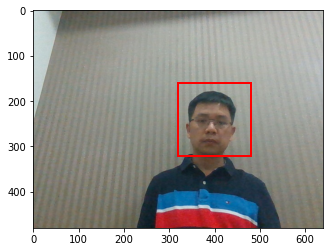

[(0.46642444, 5, 10, 1), (0.4070241, 6, 10, 1), (0.40626174, 5, 9, 1), (0.36278838, 6, 9, 1), (0.32112473, 4, 10, 1), (0.29426005, 5, 11, 1), (0.27947176, 4, 9, 1), (0.27705657, 5, 8, 1), (0.25497514, 6, 11, 1), (0.25080773, 6, 8, 1), (0.23231333, 7, 10, 1), (0.23022477, 5, 12, 1), (0.22436287, 7, 9, 1), (0.20544429, 4, 11, 1), (0.20067173, 2, 7, 2), (0.20062743, 2, 6, 2), (0.1996711, 3, 10, 1), (0.19740523, 1, 6, 2), (0.19632648, 4, 8, 1), (0.19596133, 6, 12, 1), (0.19209485, 5, 7, 1), (0.18847834, 3, 6, 2), (0.18272924, 7, 8, 1), (0.18085644, 3, 7, 2), (0.17898846, 3, 9, 1), (0.17753522, 1, 7, 2), (0.17519787, 6, 7, 1), (0.17353614, 5, 6, 2), (0.16649945, 2, 8, 2), (0.16562495, 4, 6, 2), (0.16014643, 4, 12, 1), (0.15832825, 5, 7, 2), (0.15721321, 5, 9, 2), (0.1560387, 3, 8, 2), (0.15382208, 7, 11, 1), (0.15290427, 5, 10, 2), (0.15246023, 4, 7, 2), (0.1516267, 5, 8, 2), (0.14544542, 3, 9, 2), (0.14256096, 2, 9, 2), (0.14232132, 4, 9, 2), (0.13883051, 4, 8, 2), (0.1382128, 7, 7, 1), (0

<Figure size 1152x1152 with 0 Axes>

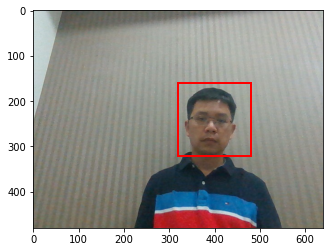

[(0.4877112, 5, 10, 1), (0.44713205, 5, 9, 1), (0.4349584, 6, 10, 1), (0.41795537, 6, 9, 1), (0.3222232, 4, 10, 1), (0.30574122, 5, 11, 1), (0.29345608, 4, 9, 1), (0.2898019, 5, 8, 1), (0.2859744, 6, 8, 1), (0.27097693, 6, 11, 1), (0.255443, 7, 9, 1), (0.2456312, 7, 10, 1), (0.23924097, 5, 12, 1), (0.22351131, 2, 6, 2), (0.21911973, 1, 6, 2), (0.21778834, 2, 7, 2), (0.21246208, 3, 6, 2), (0.20811442, 5, 7, 1), (0.20745683, 4, 11, 1), (0.20524684, 6, 7, 1), (0.20143768, 3, 10, 1), (0.20100999, 6, 12, 1), (0.19928373, 4, 8, 1), (0.19837408, 1, 7, 2), (0.19695735, 3, 7, 2), (0.19671941, 7, 8, 1), (0.19194287, 5, 6, 2), (0.18991385, 4, 6, 2), (0.18341295, 3, 9, 1), (0.1798725, 5, 9, 2), (0.17986447, 2, 8, 2), (0.17802802, 5, 7, 2), (0.17363912, 3, 8, 2), (0.17288032, 5, 10, 2), (0.17160103, 4, 7, 2), (0.17119312, 5, 8, 2), (0.1698733, 4, 12, 1), (0.16685678, 4, 9, 2), (0.16413438, 3, 9, 2), (0.16395552, 7, 11, 1), (0.16021486, 4, 8, 2), (0.15721259, 1, 8, 2), (0.15263346, 2, 9, 2), (0.1512

<Figure size 1152x1152 with 0 Axes>

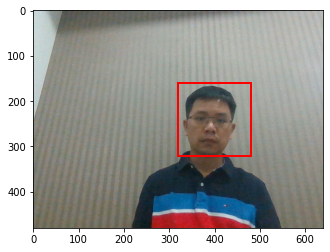

[(0.4805289, 5, 10, 1), (0.47283, 5, 9, 1), (0.42973578, 6, 9, 1), (0.42221257, 6, 10, 1), (0.32635763, 4, 10, 1), (0.31172016, 4, 9, 1), (0.3086365, 5, 11, 1), (0.30105677, 5, 8, 1), (0.29049513, 6, 8, 1), (0.2749411, 7, 9, 1), (0.2682441, 6, 11, 1), (0.25320584, 7, 10, 1), (0.23565273, 5, 12, 1), (0.2315317, 2, 6, 2), (0.2284553, 1, 6, 2), (0.22230528, 2, 7, 2), (0.22206193, 3, 6, 2), (0.21581332, 4, 11, 1), (0.20866162, 3, 7, 2), (0.2080602, 5, 7, 1), (0.20804873, 7, 8, 1), (0.20561877, 3, 10, 1), (0.2018463, 1, 7, 2), (0.2016609, 4, 8, 1), (0.20137966, 5, 6, 2), (0.20036918, 4, 6, 2), (0.19952676, 6, 7, 1), (0.19226666, 3, 9, 1), (0.19225314, 6, 12, 1), (0.19054621, 5, 9, 2), (0.18663257, 2, 8, 2), (0.18238956, 3, 8, 2), (0.17857751, 4, 9, 2), (0.17831412, 5, 10, 2), (0.17719628, 4, 7, 2), (0.17496286, 5, 7, 2), (0.17442034, 4, 12, 1), (0.17419729, 5, 8, 2), (0.17355461, 7, 11, 1), (0.17038862, 4, 8, 2), (0.16353026, 3, 9, 2), (0.1628048, 1, 8, 2), (0.16225334, 4, 10, 2), (0.160818

<Figure size 1152x1152 with 0 Axes>

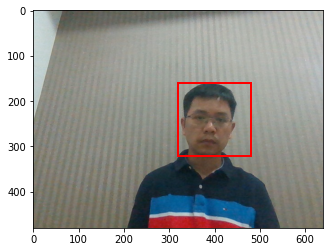

[(0.49047613, 5, 10, 1), (0.47451228, 5, 9, 1), (0.42991716, 6, 9, 1), (0.4248878, 6, 10, 1), (0.34352043, 4, 10, 1), (0.3216746, 4, 9, 1), (0.31768897, 5, 8, 1), (0.30787376, 6, 8, 1), (0.30418706, 5, 11, 1), (0.29311904, 7, 9, 1), (0.27208912, 7, 10, 1), (0.26721713, 6, 11, 1), (0.23425344, 2, 6, 2), (0.23389082, 1, 6, 2), (0.22911756, 3, 10, 1), (0.22717436, 3, 6, 2), (0.22548446, 7, 8, 1), (0.22396053, 4, 11, 1), (0.22275142, 4, 8, 1), (0.22214936, 5, 12, 1), (0.22147538, 5, 7, 1), (0.22085579, 2, 7, 2), (0.21550578, 6, 7, 1), (0.21002354, 4, 6, 2), (0.20930701, 1, 7, 2), (0.20694354, 3, 9, 1), (0.20500189, 3, 7, 2), (0.20097421, 5, 6, 2), (0.18993297, 2, 8, 2), (0.18991955, 4, 9, 2), (0.18801138, 3, 8, 2), (0.18694267, 5, 9, 2), (0.18569213, 7, 11, 1), (0.18504854, 4, 8, 2), (0.18388209, 6, 12, 1), (0.18367484, 8, 9, 1), (0.18350439, 4, 7, 2), (0.17783873, 4, 12, 1), (0.17722557, 5, 8, 2), (0.17663147, 3, 9, 2), (0.17603628, 5, 10, 2), (0.17389691, 5, 7, 2), (0.16734922, 1, 8, 2),

<Figure size 1152x1152 with 0 Axes>

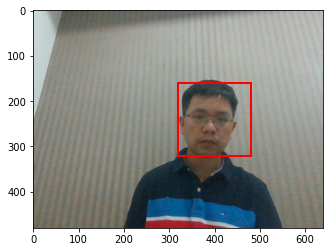

[(0.47074863, 5, 10, 1), (0.4504477, 5, 9, 1), (0.4031176, 6, 9, 1), (0.39521742, 6, 10, 1), (0.33699676, 4, 10, 1), (0.30494496, 4, 9, 1), (0.2983679, 5, 8, 1), (0.295013, 5, 11, 1), (0.29234222, 6, 8, 1), (0.27388272, 7, 9, 1), (0.25253582, 7, 10, 1), (0.24634923, 6, 11, 1), (0.23269169, 2, 6, 2), (0.22965235, 5, 12, 1), (0.22864646, 3, 10, 1), (0.22796682, 4, 11, 1), (0.22780882, 3, 6, 2), (0.22776052, 4, 6, 2), (0.22755201, 1, 6, 2), (0.22091018, 7, 8, 1), (0.22020572, 5, 6, 2), (0.21592806, 2, 7, 2), (0.21282627, 6, 7, 1), (0.2110046, 5, 7, 1), (0.20651408, 1, 7, 2), (0.20359693, 4, 8, 1), (0.20150794, 3, 7, 2), (0.20147058, 4, 9, 2), (0.19987838, 5, 9, 2), (0.1959666, 4, 7, 2), (0.19530597, 4, 12, 1), (0.19305515, 5, 7, 2), (0.1922115, 3, 9, 1), (0.19113408, 4, 8, 2), (0.1896608, 2, 8, 2), (0.18931471, 5, 8, 2), (0.18356913, 3, 8, 2), (0.18287149, 5, 10, 2), (0.17972477, 6, 12, 1), (0.17727455, 3, 9, 2), (0.1735312, 4, 10, 2), (0.17088798, 1, 8, 2), (0.16947852, 7, 11, 1), (0.168

<Figure size 1152x1152 with 0 Axes>

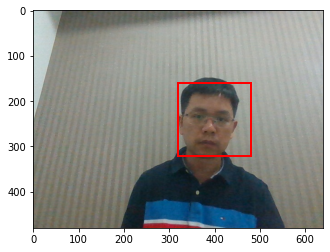

[(0.46518815, 5, 10, 1), (0.45640522, 5, 9, 1), (0.4015016, 6, 9, 1), (0.38692105, 6, 10, 1), (0.3460778, 4, 10, 1), (0.33288327, 5, 8, 1), (0.31486124, 4, 9, 1), (0.30876416, 6, 8, 1), (0.3063626, 5, 11, 1), (0.27854246, 7, 9, 1), (0.25269252, 7, 10, 1), (0.25223958, 4, 11, 1), (0.2492015, 6, 11, 1), (0.24528359, 2, 6, 2), (0.24199048, 5, 7, 1), (0.24117102, 1, 6, 2), (0.2406193, 3, 6, 2), (0.23826154, 4, 8, 1), (0.23721, 5, 12, 1), (0.23399797, 3, 10, 1), (0.23163237, 4, 6, 2), (0.22801705, 7, 8, 1), (0.22459163, 6, 7, 1), (0.22392827, 2, 7, 2), (0.2184125, 1, 7, 2), (0.21485761, 5, 6, 2), (0.21024257, 3, 7, 2), (0.2093011, 4, 12, 1), (0.20693916, 4, 7, 2), (0.20006032, 5, 7, 2), (0.19905248, 2, 8, 2), (0.1975551, 3, 9, 1), (0.19713117, 4, 8, 2), (0.1941868, 4, 9, 2), (0.19263154, 3, 8, 2), (0.19000809, 5, 9, 2), (0.18891211, 5, 8, 2), (0.18857959, 3, 11, 1), (0.1844374, 3, 9, 2), (0.1822794, 1, 8, 2), (0.17876501, 5, 10, 2), (0.1786359, 6, 12, 1), (0.17605421, 4, 7, 1), (0.17542915,

<Figure size 1152x1152 with 0 Axes>

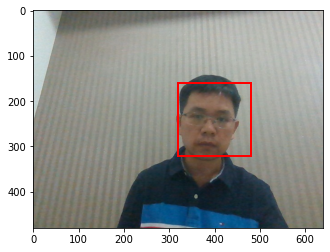

[(0.48951182, 5, 10, 1), (0.47025737, 5, 9, 1), (0.41132542, 6, 9, 1), (0.4072657, 6, 10, 1), (0.35655063, 4, 10, 1), (0.3338305, 5, 11, 1), (0.3239604, 4, 9, 1), (0.32122117, 5, 8, 1), (0.29117987, 6, 8, 1), (0.28474173, 7, 9, 1), (0.2709832, 6, 11, 1), (0.26985747, 4, 11, 1), (0.2697466, 7, 10, 1), (0.2648568, 2, 6, 2), (0.2561278, 3, 6, 2), (0.249138, 5, 12, 1), (0.24816507, 1, 6, 2), (0.24528342, 4, 6, 2), (0.2428915, 2, 7, 2), (0.23930562, 3, 10, 1), (0.2380683, 5, 6, 2), (0.23468746, 5, 7, 1), (0.2310631, 4, 8, 1), (0.23079352, 3, 7, 2), (0.22767553, 1, 7, 2), (0.22579716, 4, 7, 2), (0.22460428, 2, 8, 2), (0.223389, 4, 12, 1), (0.22207128, 5, 7, 2), (0.22205773, 3, 8, 2), (0.21910883, 4, 8, 2), (0.21725337, 7, 8, 1), (0.21637248, 6, 7, 1), (0.2093403, 4, 9, 2), (0.20607276, 3, 9, 2), (0.20525956, 5, 8, 2), (0.20076832, 1, 8, 2), (0.19942965, 3, 9, 1), (0.19908951, 2, 9, 2), (0.19578746, 5, 9, 2), (0.19482616, 3, 11, 1), (0.19405279, 8, 9, 1), (0.18961954, 6, 12, 1), (0.18726252, 

<Figure size 1152x1152 with 0 Axes>

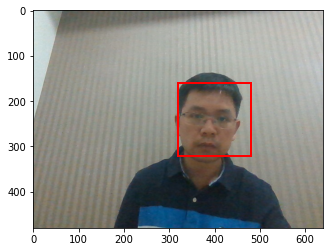

[(0.4948551, 5, 10, 1), (0.47933993, 5, 9, 1), (0.42296493, 6, 10, 1), (0.41714817, 6, 9, 1), (0.359596, 4, 10, 1), (0.34638476, 5, 8, 1), (0.33479938, 4, 9, 1), (0.3305635, 5, 11, 1), (0.3060632, 6, 8, 1), (0.29245213, 7, 9, 1), (0.28368166, 7, 10, 1), (0.27726728, 6, 11, 1), (0.27020264, 2, 6, 2), (0.26967916, 4, 11, 1), (0.26104376, 1, 6, 2), (0.25937715, 4, 8, 1), (0.25594765, 5, 7, 1), (0.25213113, 3, 6, 2), (0.2509086, 2, 7, 2), (0.24745055, 5, 12, 1), (0.24567516, 4, 6, 2), (0.238446, 1, 7, 2), (0.23601048, 5, 6, 2), (0.23373461, 7, 8, 1), (0.23369385, 3, 7, 2), (0.2327787, 3, 10, 1), (0.2322659, 4, 7, 2), (0.22826739, 6, 7, 1), (0.22781232, 4, 8, 2), (0.22778736, 2, 8, 2), (0.22603501, 3, 8, 2), (0.22369182, 5, 7, 2), (0.22320946, 4, 12, 1), (0.21625468, 4, 9, 2), (0.20931588, 5, 8, 2), (0.20539872, 3, 9, 2), (0.20179851, 5, 9, 2), (0.20078333, 3, 9, 1), (0.19982143, 1, 8, 2), (0.19838215, 7, 11, 1), (0.19554102, 8, 9, 1), (0.1937158, 5, 10, 2), (0.19337757, 3, 11, 1), (0.19229

<Figure size 1152x1152 with 0 Axes>

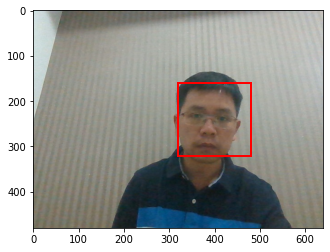

[(0.47155562, 5, 9, 1), (0.4583218, 5, 10, 1), (0.4270285, 6, 9, 1), (0.40536764, 6, 10, 1), (0.3708924, 5, 8, 1), (0.34301376, 4, 10, 1), (0.33438966, 4, 9, 1), (0.33251184, 6, 8, 1), (0.31180078, 7, 9, 1), (0.3087263, 5, 11, 1), (0.28677204, 7, 10, 1), (0.28525662, 2, 6, 2), (0.27337924, 3, 6, 2), (0.27296314, 5, 7, 1), (0.2714447, 6, 11, 1), (0.26881307, 4, 8, 1), (0.2582255, 4, 11, 1), (0.25688627, 2, 7, 2), (0.2537588, 6, 7, 1), (0.25255695, 7, 8, 1), (0.2525008, 1, 6, 2), (0.25098568, 3, 7, 2), (0.2481151, 4, 6, 2), (0.23995763, 4, 7, 2), (0.23544174, 3, 8, 2), (0.23344973, 3, 10, 1), (0.23187172, 2, 8, 2), (0.23094203, 4, 8, 2), (0.23044482, 1, 7, 2), (0.22467537, 5, 12, 1), (0.21627457, 8, 9, 1), (0.21304877, 5, 6, 2), (0.21224828, 4, 9, 2), (0.21216395, 4, 12, 1), (0.2096732, 3, 11, 1), (0.20761983, 5, 7, 2), (0.20746799, 3, 9, 2), (0.20231663, 3, 9, 1), (0.19999598, 5, 8, 2), (0.1992045, 7, 11, 1), (0.1973439, 1, 8, 2), (0.19579828, 4, 7, 1), (0.19428924, 2, 9, 2), (0.1912674

<Figure size 1152x1152 with 0 Axes>

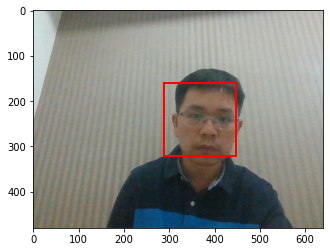

[(0.45020932, 5, 9, 1), (0.44112784, 5, 10, 1), (0.41867486, 6, 9, 1), (0.39295402, 6, 10, 1), (0.37527472, 5, 8, 1), (0.3480385, 4, 9, 1), (0.34531337, 6, 8, 1), (0.3450158, 4, 10, 1), (0.32116416, 5, 11, 1), (0.3171389, 7, 9, 1), (0.29747328, 2, 6, 2), (0.29738894, 4, 8, 1), (0.29317734, 3, 6, 2), (0.28318903, 5, 7, 1), (0.28248665, 7, 10, 1), (0.2809144, 7, 8, 1), (0.27536166, 6, 11, 1), (0.27320755, 2, 7, 2), (0.27223462, 3, 7, 2), (0.2706522, 4, 11, 1), (0.26713502, 4, 6, 2), (0.26487863, 1, 6, 2), (0.2606837, 6, 7, 1), (0.25936896, 3, 8, 2), (0.25904316, 4, 7, 2), (0.2567553, 3, 5, 2), (0.25287947, 2, 5, 2), (0.2523795, 2, 8, 2), (0.25018767, 4, 8, 2), (0.24724415, 5, 12, 1), (0.24617624, 3, 10, 1), (0.24460311, 1, 7, 2), (0.23258542, 3, 9, 1), (0.2314989, 3, 9, 2), (0.22938809, 4, 12, 1), (0.22845136, 5, 6, 2), (0.22808143, 4, 5, 2), (0.2248153, 1, 5, 2), (0.22363488, 4, 9, 2), (0.22205909, 5, 7, 2), (0.22119676, 8, 9, 1), (0.22002938, 3, 11, 1), (0.2181427, 2, 9, 2), (0.2166105

<Figure size 1152x1152 with 0 Axes>

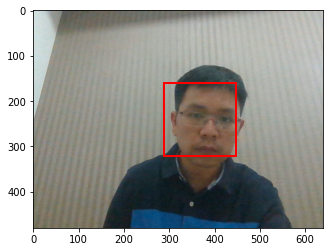

[(0.45321447, 5, 9, 1), (0.44051754, 5, 10, 1), (0.41855934, 6, 9, 1), (0.4011001, 6, 10, 1), (0.3692191, 5, 8, 1), (0.3600993, 4, 9, 1), (0.35018018, 4, 10, 1), (0.32568574, 5, 11, 1), (0.3216605, 6, 8, 1), (0.31009588, 2, 6, 2), (0.30990016, 7, 9, 1), (0.30973446, 3, 6, 2), (0.3059719, 4, 8, 1), (0.29043207, 3, 7, 2), (0.2884914, 4, 7, 2), (0.287284, 4, 6, 2), (0.2847828, 4, 11, 1), (0.28119004, 2, 7, 2), (0.28105626, 7, 10, 1), (0.2798617, 5, 7, 1), (0.27689344, 6, 11, 1), (0.27532282, 1, 6, 2), (0.2714802, 3, 8, 2), (0.27090544, 4, 8, 2), (0.2701005, 2, 5, 2), (0.26959994, 3, 5, 2), (0.25792274, 2, 8, 2), (0.2533112, 1, 7, 2), (0.2511404, 6, 7, 1), (0.24405274, 7, 8, 1), (0.24337292, 5, 12, 1), (0.24179898, 5, 7, 2), (0.24176723, 3, 10, 1), (0.24082345, 4, 12, 1), (0.2400813, 5, 6, 2), (0.23828842, 3, 9, 2), (0.23477432, 4, 5, 2), (0.23416783, 1, 5, 2), (0.23403709, 4, 9, 2), (0.23244436, 3, 11, 1), (0.22776707, 5, 8, 2), (0.22729456, 3, 9, 1), (0.22354211, 1, 8, 2), (0.22294126, 2

<Figure size 1152x1152 with 0 Axes>

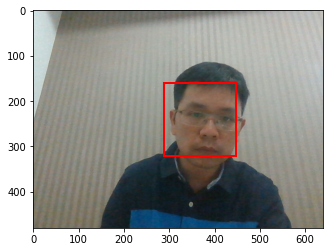

[(0.41527277, 5, 9, 1), (0.40163702, 5, 10, 1), (0.39508095, 6, 9, 1), (0.3771798, 6, 10, 1), (0.35912654, 4, 9, 1), (0.35615662, 5, 8, 1), (0.32869965, 4, 8, 1), (0.32856593, 4, 10, 1), (0.31808218, 6, 8, 1), (0.31442893, 5, 11, 1), (0.30542767, 2, 6, 2), (0.30344394, 7, 9, 1), (0.30295277, 3, 7, 2), (0.30229726, 3, 6, 2), (0.2934306, 2, 7, 2), (0.2875522, 4, 7, 2), (0.2861621, 3, 8, 2), (0.2755627, 4, 11, 1), (0.27375525, 1, 6, 2), (0.27368918, 2, 8, 2), (0.27324814, 7, 10, 1), (0.27050266, 6, 11, 1), (0.2681292, 4, 8, 2), (0.26757628, 4, 6, 2), (0.26419243, 5, 7, 1), (0.26230252, 1, 7, 2), (0.2603505, 7, 8, 1), (0.25543597, 2, 5, 2), (0.25129026, 3, 5, 2), (0.25088328, 3, 9, 1), (0.24484096, 3, 10, 1), (0.23795593, 4, 7, 1), (0.23773785, 3, 9, 2), (0.23661453, 6, 7, 1), (0.23593515, 3, 11, 1), (0.23519471, 1, 8, 2), (0.23094688, 5, 12, 1), (0.23058307, 3, 8, 1), (0.22830664, 2, 9, 2), (0.22530624, 4, 12, 1), (0.22438747, 1, 5, 2), (0.22306569, 5, 7, 2), (0.22018279, 4, 9, 2), (0.215

<Figure size 1152x1152 with 0 Axes>

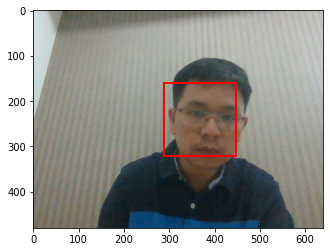

[(0.39363798, 5, 9, 1), (0.38079116, 4, 9, 1), (0.36235484, 5, 10, 1), (0.35966763, 6, 10, 1), (0.35063738, 6, 9, 1), (0.33682257, 5, 8, 1), (0.3348792, 4, 8, 1), (0.33480406, 3, 7, 2), (0.33291557, 3, 8, 2), (0.3217681, 2, 7, 2), (0.3199172, 5, 11, 1), (0.31574237, 4, 10, 1), (0.31473193, 2, 8, 2), (0.30583394, 2, 6, 2), (0.30329236, 4, 7, 2), (0.3008175, 3, 6, 2), (0.29986972, 4, 8, 2), (0.28803015, 6, 11, 1), (0.2853862, 7, 10, 1), (0.28519836, 4, 11, 1), (0.27943647, 7, 9, 1), (0.27615356, 1, 7, 2), (0.27464816, 3, 9, 1), (0.2733627, 6, 8, 1), (0.27275103, 3, 9, 2), (0.26823637, 1, 6, 2), (0.26731154, 1, 8, 2), (0.25650588, 2, 9, 2), (0.25501555, 4, 6, 2), (0.2469601, 3, 8, 1), (0.24375226, 4, 9, 2), (0.24295829, 5, 7, 1), (0.24187014, 2, 5, 2), (0.2385564, 5, 7, 2), (0.2375586, 3, 10, 1), (0.23741637, 3, 11, 1), (0.23634584, 5, 12, 1), (0.2347085, 3, 5, 2), (0.2332679, 5, 8, 2), (0.2321735, 4, 12, 1), (0.23162377, 4, 7, 1), (0.22430415, 7, 11, 1), (0.22183253, 1, 5, 2), (0.2183881

<Figure size 1152x1152 with 0 Axes>

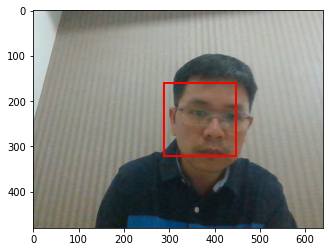

[(0.40663168, 5, 9, 1), (0.3903369, 6, 9, 1), (0.38960004, 6, 10, 1), (0.38867453, 4, 9, 1), (0.38079742, 3, 7, 2), (0.36377203, 3, 8, 2), (0.36259195, 5, 10, 1), (0.3588726, 5, 8, 1), (0.35048565, 2, 7, 2), (0.34994859, 4, 8, 1), (0.33984613, 5, 11, 1), (0.33804092, 7, 10, 1), (0.33797574, 7, 9, 1), (0.33465698, 4, 7, 2), (0.33389527, 3, 6, 2), (0.3313948, 6, 11, 1), (0.33138618, 4, 8, 2), (0.32784864, 2, 8, 2), (0.3249623, 2, 6, 2), (0.31659213, 4, 10, 1), (0.31633195, 6, 8, 1), (0.296795, 3, 9, 2), (0.291621, 1, 7, 2), (0.28948727, 3, 9, 1), (0.2782183, 1, 8, 2), (0.27451918, 4, 6, 2), (0.27436054, 2, 9, 2), (0.27332136, 5, 12, 1), (0.27191624, 4, 11, 1), (0.269525, 7, 8, 1), (0.2694978, 4, 9, 2), (0.26915437, 1, 6, 2), (0.26825297, 3, 5, 2), (0.26729348, 5, 7, 1), (0.26617435, 3, 10, 1), (0.26204693, 7, 11, 1), (0.25990853, 2, 5, 2), (0.25722912, 5, 7, 2), (0.2547783, 5, 8, 2), (0.2540937, 3, 8, 1), (0.25400728, 8, 9, 1), (0.24970883, 4, 7, 1), (0.24395779, 8, 10, 1), (0.24374501, 

<Figure size 1152x1152 with 0 Axes>

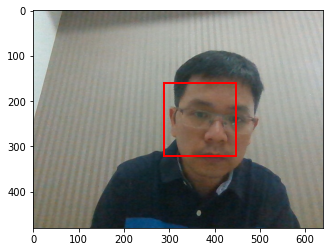

[(0.3858992, 3, 7, 2), (0.36413506, 3, 8, 2), (0.34938142, 5, 9, 1), (0.3396095, 4, 9, 1), (0.33491257, 2, 7, 2), (0.33447307, 6, 10, 1), (0.33305722, 4, 7, 2), (0.3274252, 4, 8, 2), (0.32703868, 6, 9, 1), (0.32025838, 3, 6, 2), (0.31896687, 5, 10, 1), (0.3181156, 2, 8, 2), (0.3166477, 5, 8, 1), (0.31459832, 4, 8, 1), (0.31006956, 7, 10, 1), (0.30755082, 7, 9, 1), (0.30590445, 5, 11, 1), (0.29778025, 2, 6, 2), (0.28741863, 6, 11, 1), (0.284578, 3, 9, 2), (0.27450418, 6, 8, 1), (0.27360258, 4, 10, 1), (0.2697603, 4, 6, 2), (0.2690544, 1, 8, 2), (0.26730287, 1, 7, 2), (0.26598507, 3, 9, 1), (0.26578256, 2, 9, 2), (0.2576307, 4, 9, 2), (0.2538184, 5, 12, 1), (0.24883631, 7, 8, 1), (0.2481247, 3, 5, 2), (0.24791116, 4, 11, 1), (0.24750434, 5, 8, 2), (0.2469712, 5, 7, 2), (0.24313232, 7, 11, 1), (0.24058132, 5, 7, 1), (0.24006462, 8, 9, 1), (0.23999679, 2, 5, 2), (0.23839693, 1, 6, 2), (0.23775245, 3, 8, 1), (0.2326006, 3, 10, 1), (0.2314888, 8, 10, 1), (0.23021504, 4, 7, 1), (0.2291403, 1,

<Figure size 1152x1152 with 0 Axes>

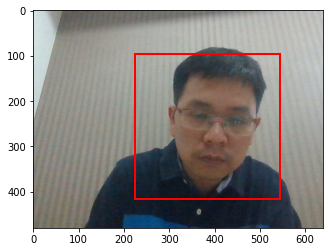

[(0.39518788, 3, 7, 2), (0.36431244, 3, 8, 2), (0.3495018, 2, 7, 2), (0.33381253, 4, 8, 1), (0.33006698, 4, 7, 2), (0.32591617, 3, 6, 2), (0.3247166, 2, 8, 2), (0.32218266, 4, 9, 1), (0.3128703, 5, 9, 1), (0.3128692, 6, 9, 1), (0.31173432, 4, 8, 2), (0.31128326, 7, 10, 1), (0.3098507, 7, 9, 1), (0.30840567, 6, 10, 1), (0.3050741, 2, 6, 2), (0.30275002, 5, 8, 1), (0.27791417, 3, 9, 1), (0.2758859, 3, 8, 1), (0.27220014, 4, 6, 2), (0.27116454, 1, 7, 2), (0.2711281, 5, 11, 1), (0.27010298, 1, 8, 2), (0.26939276, 6, 11, 1), (0.26805744, 6, 8, 1), (0.26540482, 5, 10, 1), (0.2579746, 3, 9, 2), (0.25763345, 7, 8, 1), (0.25760418, 3, 5, 2), (0.25171667, 2, 9, 2), (0.24762014, 4, 7, 1), (0.24444859, 5, 7, 2), (0.2435823, 2, 5, 2), (0.23948236, 0, 8, 2), (0.23941563, 7, 11, 1), (0.23864268, 5, 7, 1), (0.23705061, 1, 6, 2), (0.23553883, 4, 10, 1), (0.23212013, 5, 8, 2), (0.22766818, 5, 6, 2), (0.22755286, 0, 7, 2), (0.22495694, 4, 9, 2), (0.2245858, 3, 10, 1), (0.22311735, 3, 4, 2), (0.22297029, 

<Figure size 1152x1152 with 0 Axes>

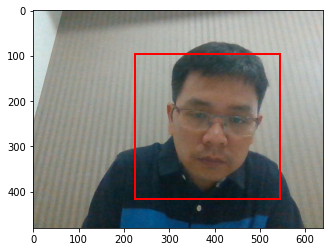

[(0.38975078, 3, 7, 2), (0.36971068, 3, 8, 2), (0.35190713, 2, 7, 2), (0.34724388, 2, 8, 2), (0.347044, 4, 8, 1), (0.32643437, 4, 7, 2), (0.31051156, 4, 9, 1), (0.30677092, 4, 8, 2), (0.3053444, 3, 6, 2), (0.29750544, 3, 8, 1), (0.29276463, 1, 8, 2), (0.2901275, 3, 9, 1), (0.28977913, 2, 6, 2), (0.28931788, 5, 8, 1), (0.2829298, 6, 10, 1), (0.28224918, 7, 10, 1), (0.279437, 5, 11, 1), (0.2755626, 1, 7, 2), (0.27130687, 5, 9, 1), (0.26980072, 4, 7, 1), (0.2683177, 2, 9, 2), (0.26560047, 4, 6, 2), (0.26505598, 6, 11, 1), (0.2625309, 7, 9, 1), (0.26179925, 3, 9, 2), (0.26115564, 6, 9, 1), (0.25382718, 5, 10, 1), (0.24748808, 1, 9, 2), (0.24743608, 0, 8, 2), (0.24707209, 6, 8, 1), (0.24436693, 3, 5, 2), (0.24381727, 5, 7, 1), (0.24090052, 5, 7, 2), (0.24044932, 2, 5, 2), (0.24002469, 3, 10, 1), (0.23551834, 7, 8, 1), (0.23444003, 4, 11, 1), (0.2316805, 4, 10, 1), (0.2303036, 1, 6, 2), (0.22952822, 5, 6, 2), (0.22835833, 7, 11, 1), (0.2281641, 0, 7, 2), (0.22419313, 3, 4, 2), (0.22364858, 3

<Figure size 1152x1152 with 0 Axes>

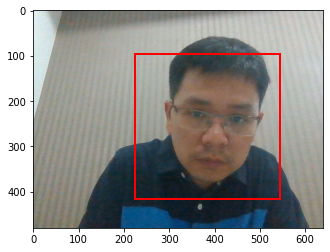

[(0.36721346, 3, 7, 2), (0.35567674, 2, 7, 2), (0.34902835, 3, 8, 2), (0.34442958, 2, 8, 2), (0.33725247, 4, 8, 1), (0.3346394, 3, 8, 1), (0.30331787, 3, 9, 1), (0.29953128, 1, 8, 2), (0.29875505, 4, 9, 1), (0.29518992, 4, 7, 2), (0.2925184, 3, 6, 2), (0.2906276, 1, 7, 2), (0.28666726, 2, 6, 2), (0.27764466, 4, 8, 2), (0.26913753, 7, 10, 1), (0.26910678, 5, 8, 1), (0.2670805, 5, 9, 1), (0.26697335, 6, 10, 1), (0.2668454, 2, 8, 1), (0.2666988, 5, 11, 1), (0.26091596, 6, 11, 1), (0.25950944, 6, 9, 1), (0.2589811, 0, 8, 2), (0.2587246, 4, 7, 1), (0.25855178, 2, 9, 2), (0.25794125, 7, 9, 1), (0.2539856, 2, 9, 1), (0.25225556, 3, 7, 1), (0.24824879, 3, 9, 2), (0.24778844, 4, 6, 2), (0.24221157, 6, 8, 1), (0.23930809, 1, 9, 2), (0.23921074, 0, 7, 2), (0.2353477, 3, 5, 2), (0.23515369, 5, 10, 1), (0.23333438, 1, 6, 2), (0.2309616, 5, 7, 2), (0.23038952, 7, 8, 1), (0.228052, 2, 5, 2), (0.2262959, 7, 11, 1), (0.22261666, 3, 10, 1), (0.21819396, 4, 11, 1), (0.21742031, 2, 10, 1), (0.2161391, 5, 

<Figure size 1152x1152 with 0 Axes>

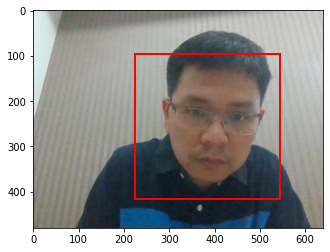

[(0.37112144, 2, 8, 2), (0.3685633, 3, 7, 2), (0.36595038, 2, 7, 2), (0.35210785, 3, 8, 2), (0.33726835, 1, 8, 2), (0.32267198, 3, 8, 1), (0.30665228, 1, 7, 2), (0.30559218, 4, 8, 1), (0.29597047, 4, 7, 2), (0.28202024, 0, 8, 2), (0.2812344, 3, 6, 2), (0.2788196, 3, 9, 1), (0.27712074, 2, 9, 2), (0.27679163, 1, 9, 2), (0.27597046, 4, 8, 2), (0.27478874, 2, 6, 2), (0.26934537, 5, 11, 1), (0.26564473, 4, 9, 1), (0.26362607, 2, 8, 1), (0.257067, 3, 7, 1), (0.2530114, 4, 7, 1), (0.2505177, 2, 9, 1), (0.24991283, 3, 9, 2), (0.24812205, 6, 11, 1), (0.24763268, 0, 7, 2), (0.2457533, 0, 9, 2), (0.2448735, 7, 10, 1), (0.24445002, 4, 6, 2), (0.24192165, 5, 9, 1), (0.24167818, 6, 10, 1), (0.2408202, 5, 8, 1), (0.23733598, 6, 9, 1), (0.23565802, 7, 9, 1), (0.23189023, 5, 7, 2), (0.22738022, 1, 6, 2), (0.22481368, 4, 11, 1), (0.22329856, 6, 8, 1), (0.22204374, 5, 10, 1), (0.22086701, 2, 10, 1), (0.21700458, 3, 5, 2), (0.21615854, 5, 6, 2), (0.21589342, 7, 8, 1), (0.21533075, 2, 5, 2), (0.21463749, 

<Figure size 1152x1152 with 0 Axes>

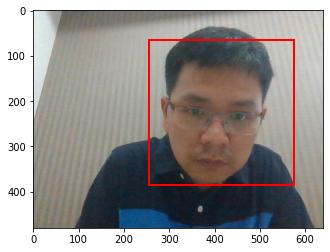

[(0.37878528, 2, 8, 2), (0.37621763, 2, 7, 2), (0.35890126, 3, 7, 2), (0.3445242, 1, 8, 2), (0.34406713, 3, 8, 2), (0.31667152, 3, 8, 1), (0.31421408, 1, 7, 2), (0.30151826, 4, 8, 1), (0.28356436, 3, 9, 1), (0.28323108, 3, 6, 2), (0.281509, 2, 6, 2), (0.27834025, 4, 9, 1), (0.27465433, 4, 7, 2), (0.27215317, 0, 8, 2), (0.26417297, 2, 9, 2), (0.26249337, 1, 9, 2), (0.2603731, 5, 11, 1), (0.25966224, 6, 10, 1), (0.25866175, 4, 8, 2), (0.25422308, 2, 8, 1), (0.25182652, 5, 9, 1), (0.24868712, 6, 9, 1), (0.24755292, 2, 9, 1), (0.24543789, 5, 8, 1), (0.24491225, 6, 11, 1), (0.24429962, 5, 12, 1), (0.24378853, 0, 7, 2), (0.24329893, 4, 6, 2), (0.24221596, 4, 7, 1), (0.24180457, 3, 7, 1), (0.23956487, 4, 12, 1), (0.23731858, 3, 9, 2), (0.23199557, 6, 8, 1), (0.22797604, 1, 6, 2), (0.22698164, 5, 10, 1), (0.22552718, 0, 9, 2), (0.22397906, 2, 5, 2), (0.22365372, 4, 11, 1), (0.22225577, 5, 7, 2), (0.22207078, 3, 5, 2), (0.2193501, 5, 6, 2), (0.21452837, 2, 12, 1), (0.21291149, 2, 4, 2), (0.2100

<Figure size 1152x1152 with 0 Axes>

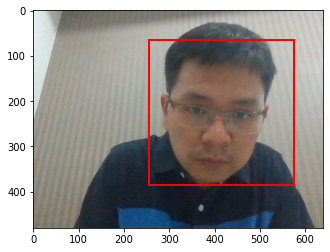

[(0.38097477, 2, 7, 2), (0.37993485, 2, 8, 2), (0.35595012, 1, 8, 2), (0.34929496, 3, 8, 1), (0.3393289, 3, 7, 2), (0.32714492, 1, 7, 2), (0.32381237, 3, 8, 2), (0.3185583, 4, 8, 1), (0.3001676, 2, 8, 1), (0.2980549, 0, 8, 2), (0.2942621, 3, 9, 1), (0.29214543, 6, 10, 1), (0.2900772, 2, 6, 2), (0.28926358, 4, 9, 1), (0.2849037, 3, 7, 1), (0.27942723, 6, 9, 1), (0.27722788, 5, 9, 1), (0.27676094, 2, 9, 1), (0.27212477, 1, 9, 2), (0.27031574, 3, 6, 2), (0.27017134, 5, 8, 1), (0.2651156, 0, 7, 2), (0.26104766, 4, 7, 1), (0.25993, 2, 9, 2), (0.25443146, 0, 9, 2), (0.2539243, 4, 7, 2), (0.25346822, 6, 11, 1), (0.2531437, 6, 8, 1), (0.24965145, 5, 11, 1), (0.24740607, 5, 10, 1), (0.24403259, 1, 6, 2), (0.23887141, 2, 7, 1), (0.23780212, 4, 12, 1), (0.23731543, 4, 8, 2), (0.23557402, 2, 5, 2), (0.23362899, 5, 12, 1), (0.22904332, 4, 6, 2), (0.22756338, 2, 4, 2), (0.22590831, 3, 9, 2), (0.22473037, 5, 7, 1), (0.22090936, 5, 6, 2), (0.22038944, 5, 7, 2), (0.21975501, 3, 5, 2), (0.2163895, 1, 12

<Figure size 1152x1152 with 0 Axes>

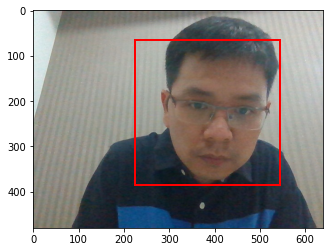

[(0.40226346, 2, 8, 2), (0.39615443, 2, 7, 2), (0.38328353, 1, 8, 2), (0.34702882, 1, 7, 2), (0.33443522, 3, 7, 2), (0.32685715, 3, 8, 2), (0.31853312, 3, 8, 1), (0.3133113, 0, 8, 2), (0.30141437, 2, 6, 2), (0.29425463, 6, 9, 1), (0.2924951, 6, 10, 1), (0.29084635, 1, 9, 2), (0.29030776, 2, 8, 1), (0.28567964, 4, 8, 1), (0.28551862, 3, 9, 1), (0.28345463, 5, 9, 1), (0.2833182, 4, 9, 1), (0.2823967, 2, 9, 1), (0.28158236, 2, 9, 2), (0.2707727, 0, 7, 2), (0.270606, 3, 6, 2), (0.26818573, 0, 9, 2), (0.25850713, 5, 8, 1), (0.25829116, 6, 8, 1), (0.25711584, 5, 10, 1), (0.25268865, 1, 6, 2), (0.25140816, 4, 7, 2), (0.2504115, 5, 11, 1), (0.24454804, 2, 5, 2), (0.24440192, 6, 11, 1), (0.23937395, 3, 7, 1), (0.2392706, 4, 8, 2), (0.23584732, 3, 9, 2), (0.23444359, 1, 8, 1), (0.232788, 1, 9, 1), (0.23205735, 4, 6, 2), (0.23203108, 2, 10, 1), (0.22931308, 2, 4, 2), (0.22811893, 4, 11, 1), (0.22366795, 1, 10, 1), (0.22113942, 3, 5, 2), (0.2210721, 0, 10, 2), (0.22070648, 4, 10, 1), (0.21938892, 

<Figure size 1152x1152 with 0 Axes>

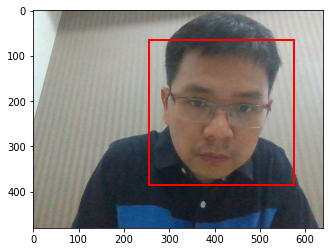

[(0.3765768, 1, 8, 2), (0.36160478, 2, 8, 2), (0.35356194, 2, 7, 2), (0.33247018, 0, 8, 2), (0.32835668, 1, 7, 2), (0.30618128, 3, 8, 1), (0.29951784, 2, 8, 1), (0.29646742, 3, 7, 2), (0.2856389, 3, 8, 2), (0.284237, 1, 9, 2), (0.27666563, 0, 9, 2), (0.27615425, 2, 9, 1), (0.27353495, 0, 7, 2), (0.27112266, 2, 6, 2), (0.26875123, 4, 8, 1), (0.2648785, 3, 9, 1), (0.25962353, 2, 9, 2), (0.25242028, 4, 9, 1), (0.25012386, 6, 10, 1), (0.24998659, 4, 12, 1), (0.24978806, 1, 8, 1), (0.2475894, 5, 8, 1), (0.24628681, 3, 6, 2), (0.24559566, 6, 9, 1), (0.24474253, 1, 9, 1), (0.24243586, 6, 8, 1), (0.2383843, 4, 7, 2), (0.23683733, 5, 9, 1), (0.23222327, 1, 6, 2), (0.2277905, 5, 12, 1), (0.22391188, 1, 12, 1), (0.22369918, 5, 11, 1), (0.22233628, 3, 12, 1), (0.22221573, 1, 10, 1), (0.22149605, 4, 8, 2), (0.22138986, 2, 5, 2), (0.22103655, 3, 7, 1), (0.22025242, 4, 6, 2), (0.21676843, 2, 7, 1), (0.2162903, 6, 11, 1), (0.21586825, 2, 12, 1), (0.21496852, 0, 10, 2), (0.2137584, 5, 10, 1), (0.212974

<Figure size 1152x1152 with 0 Axes>

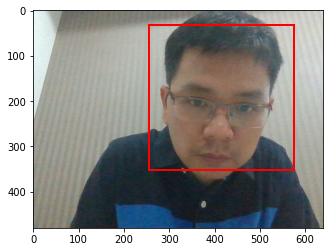

[(0.3858875, 1, 8, 2), (0.37921545, 2, 8, 2), (0.3545971, 2, 7, 2), (0.34213364, 0, 8, 2), (0.3287958, 1, 7, 2), (0.31713206, 3, 8, 2), (0.30913004, 3, 7, 2), (0.30541176, 3, 8, 1), (0.29602137, 1, 9, 2), (0.28892598, 2, 8, 1), (0.28728008, 4, 8, 1), (0.2838927, 0, 9, 2), (0.28385046, 2, 9, 2), (0.28311026, 4, 9, 1), (0.27918452, 0, 7, 2), (0.27563763, 3, 9, 1), (0.27505526, 2, 6, 2), (0.27156636, 2, 9, 1), (0.2642427, 5, 9, 1), (0.26313525, 5, 8, 1), (0.25890237, 4, 12, 1), (0.25664333, 3, 6, 2), (0.25236368, 4, 8, 2), (0.25146192, 4, 7, 2), (0.247301, 3, 9, 2), (0.24702586, 1, 9, 1), (0.24695475, 5, 12, 1), (0.24417973, 1, 8, 1), (0.23376788, 1, 6, 2), (0.23002984, 2, 5, 2), (0.22825882, 3, 7, 1), (0.22808608, 4, 6, 2), (0.22564794, 5, 11, 1), (0.22521682, 5, 10, 1), (0.2232818, 1, 10, 1), (0.21919616, 5, 7, 2), (0.21748187, 0, 10, 2), (0.21637288, 5, 8, 2), (0.21481405, 4, 7, 1), (0.21454738, 2, 7, 1), (0.2143207, 3, 5, 2), (0.21043237, 1, 4, 2), (0.21010537, 3, 12, 1), (0.21001844,

<Figure size 1152x1152 with 0 Axes>

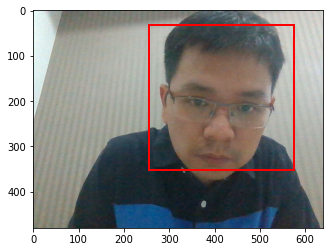

[(0.37841436, 1, 8, 2), (0.35094154, 0, 8, 2), (0.34545243, 2, 8, 2), (0.32539284, 2, 7, 2), (0.31867984, 1, 7, 2), (0.30456528, 2, 8, 1), (0.302059, 3, 8, 1), (0.29500654, 1, 9, 2), (0.2948226, 0, 9, 2), (0.2830602, 3, 8, 2), (0.28101933, 3, 7, 2), (0.2795109, 0, 7, 2), (0.27661064, 4, 8, 1), (0.27462304, 2, 9, 1), (0.27368543, 4, 9, 1), (0.2716751, 3, 9, 1), (0.26531482, 1, 8, 1), (0.26424918, 2, 9, 2), (0.25934607, 4, 12, 1), (0.25545406, 2, 6, 2), (0.25413802, 5, 8, 1), (0.24962729, 1, 9, 1), (0.24712068, 2, 7, 1), (0.24611011, 5, 9, 1), (0.24344501, 3, 7, 1), (0.24151197, 4, 7, 2), (0.23615758, 4, 8, 2), (0.23556434, 3, 6, 2), (0.2338259, 5, 12, 1), (0.23038614, 3, 9, 2), (0.22830342, 1, 6, 2), (0.22041024, 5, 7, 2), (0.21952997, 4, 7, 1), (0.21766363, 4, 6, 2), (0.2173164, 0, 10, 2), (0.21679063, 1, 12, 1), (0.216093, 1, 10, 1), (0.21407877, 1, 11, 1), (0.21395192, 1, 7, 1), (0.21340287, 5, 8, 2), (0.21274246, 1, 4, 2), (0.2126052, 2, 5, 2), (0.21145843, 5, 7, 1), (0.20855805, 3,

<Figure size 1152x1152 with 0 Axes>

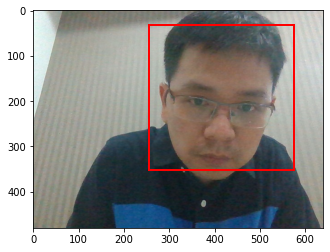

[(0.3750051, 1, 8, 2), (0.35238612, 2, 8, 2), (0.35005563, 0, 8, 2), (0.327968, 2, 7, 2), (0.32114246, 1, 7, 2), (0.30775002, 3, 8, 1), (0.30329034, 2, 8, 1), (0.2982465, 0, 9, 2), (0.28963867, 1, 9, 2), (0.28111947, 3, 8, 2), (0.2793202, 0, 7, 2), (0.2759755, 4, 8, 1), (0.27047697, 3, 9, 1), (0.27013925, 2, 9, 1), (0.26993525, 2, 9, 2), (0.26910365, 4, 12, 1), (0.26783702, 3, 7, 2), (0.26437095, 1, 8, 1), (0.25604227, 5, 12, 1), (0.2554097, 4, 9, 1), (0.24887884, 1, 9, 1), (0.2479689, 2, 6, 2), (0.2353389, 5, 8, 1), (0.23489979, 2, 7, 1), (0.2323925, 3, 9, 2), (0.23170356, 3, 7, 1), (0.22802775, 4, 8, 2), (0.22610497, 1, 6, 2), (0.22595899, 4, 7, 2), (0.22125107, 0, 10, 2), (0.21852428, 5, 9, 1), (0.21627982, 3, 6, 2), (0.21599269, 5, 11, 1), (0.21037312, 3, 12, 1), (0.20779842, 4, 7, 1), (0.2072329, 1, 12, 1), (0.20689887, 5, 7, 2), (0.20657852, 5, 8, 2), (0.20371544, 2, 5, 2), (0.20325203, 4, 11, 1), (0.20239899, 1, 7, 1), (0.20120996, 1, 4, 2), (0.20012924, 1, 10, 2), (0.19878887, 

<Figure size 1152x1152 with 0 Axes>

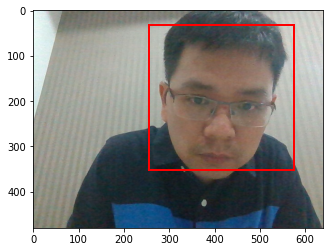

[(0.3910985, 1, 8, 2), (0.3668692, 0, 8, 2), (0.36415178, 2, 8, 2), (0.34364346, 2, 7, 2), (0.32776016, 1, 7, 2), (0.32183427, 0, 9, 2), (0.3019509, 1, 9, 2), (0.28963158, 3, 7, 2), (0.2883831, 3, 8, 1), (0.28808317, 3, 8, 2), (0.28754348, 4, 12, 1), (0.28722638, 2, 8, 1), (0.2768135, 0, 7, 2), (0.26998615, 2, 9, 2), (0.26563177, 2, 6, 2), (0.2651893, 3, 9, 1), (0.26309004, 2, 9, 1), (0.2577639, 4, 8, 1), (0.25335857, 4, 9, 1), (0.2527771, 5, 12, 1), (0.24760579, 3, 12, 1), (0.24754037, 4, 7, 2), (0.24375789, 0, 10, 2), (0.24317537, 1, 8, 1), (0.24192521, 3, 6, 2), (0.23741251, 1, 12, 1), (0.23577745, 1, 9, 1), (0.23278321, 1, 6, 2), (0.23235704, 4, 8, 2), (0.23222043, 5, 8, 1), (0.23190676, 5, 11, 1), (0.22955672, 5, 9, 1), (0.22861099, 2, 12, 1), (0.22645147, 2, 7, 1), (0.22639926, 3, 9, 2), (0.22578332, 5, 7, 2), (0.22381827, 0, 12, 1), (0.2233127, 4, 6, 2), (0.2214319, 3, 7, 1), (0.21975121, 4, 11, 1), (0.21771817, 2, 5, 2), (0.21490997, 1, 11, 1), (0.21442233, 5, 8, 2), (0.2107988

<Figure size 1152x1152 with 0 Axes>

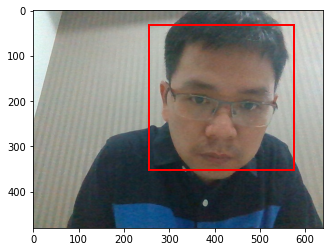

[(0.3670184, 1, 8, 2), (0.34757704, 0, 8, 2), (0.34477317, 2, 8, 2), (0.31746036, 2, 8, 1), (0.3092425, 0, 9, 2), (0.30567774, 3, 8, 1), (0.3051969, 2, 7, 2), (0.299689, 1, 9, 2), (0.2906228, 1, 7, 2), (0.2856727, 2, 9, 1), (0.28193596, 3, 9, 1), (0.27625984, 3, 8, 2), (0.27617466, 2, 9, 2), (0.2707082, 1, 8, 1), (0.2648584, 3, 7, 2), (0.2636515, 4, 8, 1), (0.2585992, 4, 12, 1), (0.2580243, 4, 9, 1), (0.25316054, 0, 7, 2), (0.2523534, 1, 9, 1), (0.24744831, 5, 12, 1), (0.24096256, 2, 6, 2), (0.233474, 2, 7, 1), (0.22863527, 4, 7, 2), (0.22798486, 0, 10, 2), (0.2277924, 3, 9, 2), (0.22654398, 5, 8, 1), (0.22621305, 4, 8, 2), (0.22459096, 3, 7, 1), (0.22285157, 3, 6, 2), (0.21852654, 5, 9, 1), (0.21429297, 1, 6, 2), (0.2096587, 5, 7, 2), (0.20801145, 5, 8, 2), (0.20681912, 1, 7, 1), (0.20596482, 2, 5, 2), (0.20382167, 1, 4, 2), (0.20369306, 1, 10, 2), (0.20368001, 3, 12, 1), (0.20315994, 4, 6, 2), (0.20107606, 2, 4, 2), (0.19810364, 0, 8, 1), (0.1962384, 4, 7, 1), (0.1962113, 1, 5, 2), (

<Figure size 1152x1152 with 0 Axes>

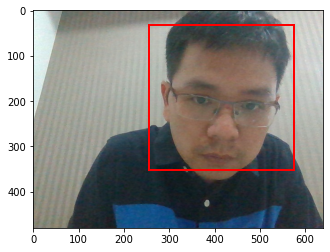

[(0.37499335, 1, 8, 2), (0.35582572, 2, 8, 2), (0.34385818, 0, 8, 2), (0.32330665, 2, 8, 1), (0.3188304, 0, 9, 2), (0.31870997, 1, 9, 2), (0.3163276, 3, 8, 1), (0.31086084, 2, 7, 2), (0.30631742, 2, 9, 1), (0.30308312, 3, 9, 1), (0.2967711, 2, 9, 2), (0.29486623, 1, 7, 2), (0.29121298, 3, 8, 2), (0.28939858, 1, 8, 1), (0.28493094, 1, 9, 1), (0.27867368, 4, 8, 1), (0.27376193, 4, 9, 1), (0.2663309, 3, 7, 2), (0.25709933, 3, 9, 2), (0.2505254, 0, 7, 2), (0.24725275, 2, 6, 2), (0.24434623, 5, 8, 1), (0.24223192, 4, 8, 2), (0.24165896, 0, 10, 2), (0.23858592, 5, 12, 1), (0.23844816, 4, 12, 1), (0.23679005, 5, 9, 1), (0.2310122, 1, 10, 1), (0.23011966, 2, 7, 1), (0.22882947, 4, 7, 2), (0.22846165, 3, 7, 1), (0.22462004, 1, 6, 2), (0.2238533, 3, 6, 2), (0.22360341, 4, 9, 2), (0.22288312, 0, 9, 1), (0.22247407, 0, 8, 1), (0.2212761, 5, 8, 2), (0.21864249, 1, 10, 2), (0.21646856, 2, 5, 2), (0.21609068, 1, 4, 2), (0.21323474, 5, 7, 2), (0.2130639, 1, 5, 2), (0.2118017, 2, 10, 2), (0.21124652, 2

<Figure size 1152x1152 with 0 Axes>

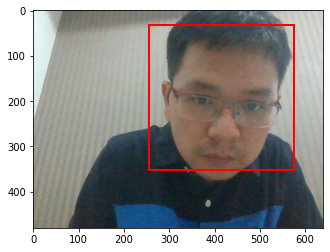

[(0.3824482, 1, 8, 2), (0.37236172, 2, 8, 2), (0.3438073, 0, 8, 2), (0.32604927, 1, 9, 2), (0.3247791, 0, 9, 2), (0.3220588, 2, 7, 2), (0.3088341, 2, 8, 1), (0.30801967, 2, 9, 2), (0.2998502, 3, 8, 2), (0.29860207, 3, 8, 1), (0.29723704, 1, 7, 2), (0.29628018, 2, 9, 1), (0.287792, 3, 9, 1), (0.27238673, 1, 8, 1), (0.26963586, 3, 7, 2), (0.26610726, 1, 9, 1), (0.2636801, 4, 9, 1), (0.26285404, 3, 9, 2), (0.25774345, 4, 8, 1), (0.25231397, 4, 12, 1), (0.2484153, 5, 12, 1), (0.24763098, 0, 7, 2), (0.24601585, 2, 6, 2), (0.24358466, 0, 10, 2), (0.23914413, 4, 8, 2), (0.23066746, 4, 7, 2), (0.22880863, 5, 9, 1), (0.22843853, 5, 8, 1), (0.22576678, 0, 8, 1), (0.22513561, 5, 11, 1), (0.22404538, 2, 7, 1), (0.22046374, 1, 6, 2), (0.21994458, 5, 8, 2), (0.21958134, 0, 9, 1), (0.2193015, 5, 7, 2), (0.21911213, 1, 10, 2), (0.21767388, 1, 10, 1), (0.21756089, 3, 6, 2), (0.2165281, 3, 7, 1), (0.21223858, 4, 9, 2), (0.21057384, 2, 10, 2), (0.20883836, 1, 7, 1), (0.20711221, 2, 10, 1), (0.20531541, 1

<Figure size 1152x1152 with 0 Axes>

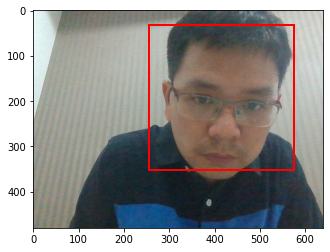

[(0.38565168, 1, 8, 2), (0.35849905, 0, 8, 2), (0.3506748, 2, 8, 2), (0.3187515, 0, 9, 2), (0.3173638, 2, 8, 1), (0.31563538, 3, 8, 1), (0.314735, 1, 9, 2), (0.31430763, 2, 7, 2), (0.31193346, 1, 7, 2), (0.30121964, 3, 9, 1), (0.29497197, 4, 8, 1), (0.29452756, 4, 9, 1), (0.2868608, 2, 9, 1), (0.28163096, 2, 9, 2), (0.2809903, 1, 8, 1), (0.27131355, 3, 8, 2), (0.26411083, 0, 7, 2), (0.26394102, 1, 9, 1), (0.26180038, 4, 12, 1), (0.25944626, 3, 7, 2), (0.25910562, 5, 8, 1), (0.25124753, 2, 6, 2), (0.24866126, 5, 9, 1), (0.24460456, 2, 7, 1), (0.24446076, 3, 7, 1), (0.24192084, 5, 12, 1), (0.23634264, 1, 6, 2), (0.23421198, 5, 11, 1), (0.23147072, 4, 7, 1), (0.22950307, 0, 10, 2), (0.22740495, 3, 9, 2), (0.22583441, 4, 7, 2), (0.22389339, 4, 8, 2), (0.22379097, 1, 4, 2), (0.22045584, 3, 6, 2), (0.21993549, 0, 8, 1), (0.21872127, 1, 7, 1), (0.21703357, 1, 5, 2), (0.21701078, 5, 10, 1), (0.21618913, 2, 5, 2), (0.21455102, 4, 11, 1), (0.21407458, 2, 4, 2), (0.21353777, 4, 10, 1), (0.2090069

<Figure size 1152x1152 with 0 Axes>

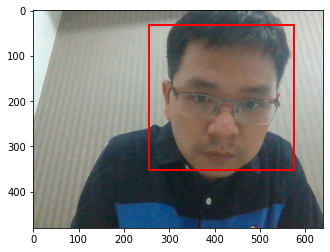

[(0.4020429, 1, 8, 2), (0.3795615, 2, 8, 2), (0.36410102, 0, 8, 2), (0.35221076, 2, 7, 2), (0.346205, 1, 7, 2), (0.31665373, 3, 8, 1), (0.3080899, 3, 9, 1), (0.30564559, 0, 9, 2), (0.30513674, 1, 9, 2), (0.30357733, 2, 8, 1), (0.29178482, 2, 9, 1), (0.2891702, 3, 8, 2), (0.28832254, 0, 7, 2), (0.28626332, 4, 9, 1), (0.28528023, 2, 9, 2), (0.28376243, 3, 7, 2), (0.28274918, 4, 12, 1), (0.28038204, 4, 8, 1), (0.27296704, 2, 6, 2), (0.25994638, 5, 9, 1), (0.25723526, 1, 6, 2), (0.25452068, 1, 8, 1), (0.2542, 5, 11, 1), (0.25175327, 1, 9, 1), (0.25160038, 5, 12, 1), (0.2487647, 5, 10, 1), (0.24731447, 3, 12, 1), (0.24453661, 5, 8, 1), (0.23901868, 4, 7, 2), (0.2369268, 3, 6, 2), (0.23483878, 4, 8, 2), (0.23399891, 3, 7, 1), (0.23386553, 4, 11, 1), (0.23341256, 3, 9, 2), (0.2259322, 1, 5, 2), (0.2254075, 4, 10, 1), (0.22422557, 2, 5, 2), (0.22285692, 0, 10, 2), (0.21826339, 2, 7, 1), (0.21695197, 4, 7, 1), (0.21654943, 4, 6, 2), (0.21451749, 0, 6, 2), (0.2136981, 5, 8, 2), (0.21337003, 1, 4

<Figure size 1152x1152 with 0 Axes>

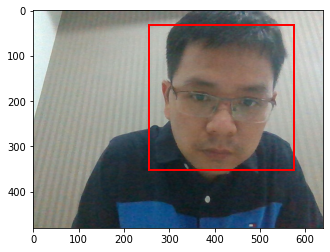

[(0.39609963, 1, 8, 2), (0.38430184, 1, 7, 2), (0.36697567, 2, 7, 2), (0.36593822, 0, 8, 2), (0.35221276, 2, 8, 2), (0.33425963, 2, 8, 1), (0.32784972, 3, 8, 1), (0.32514036, 0, 7, 2), (0.3002289, 2, 6, 2), (0.29637182, 2, 9, 1), (0.2960064, 3, 9, 1), (0.2953287, 1, 8, 1), (0.2932942, 1, 6, 2), (0.29286402, 4, 8, 1), (0.28716713, 0, 9, 2), (0.2870763, 4, 9, 1), (0.2837113, 1, 9, 1), (0.2825074, 1, 9, 2), (0.28140035, 3, 7, 2), (0.27142453, 5, 10, 1), (0.2683821, 5, 9, 1), (0.26700675, 3, 8, 2), (0.26477322, 5, 8, 1), (0.25713977, 3, 7, 1), (0.25578004, 2, 7, 1), (0.24986018, 2, 9, 2), (0.24877657, 3, 6, 2), (0.24730337, 1, 5, 2), (0.24566722, 0, 6, 2), (0.24313203, 2, 5, 2), (0.24259073, 4, 10, 1), (0.24180101, 1, 10, 1), (0.24100849, 5, 11, 1), (0.23607986, 4, 7, 1), (0.2360396, 1, 4, 2), (0.2335032, 4, 11, 1), (0.23251511, 1, 12, 1), (0.2302464, 0, 8, 1), (0.22917108, 4, 7, 2), (0.22810797, 0, 12, 1), (0.22693688, 4, 12, 1), (0.22576231, 1, 7, 1), (0.22407211, 0, 5, 2), (0.22406779, 

<Figure size 1152x1152 with 0 Axes>

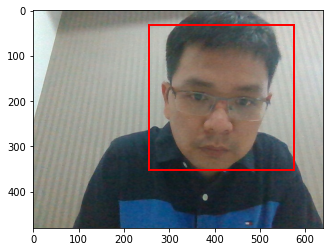

[(0.3805331, 1, 7, 2), (0.37967092, 2, 7, 2), (0.37314418, 1, 8, 2), (0.35640836, 2, 8, 2), (0.34120676, 3, 8, 1), (0.3381063, 2, 8, 1), (0.3321649, 0, 8, 2), (0.30888274, 0, 7, 2), (0.30624896, 3, 9, 1), (0.3053561, 2, 6, 2), (0.30498886, 2, 9, 1), (0.30007666, 1, 6, 2), (0.29814407, 3, 7, 2), (0.29131112, 4, 9, 1), (0.2912126, 5, 9, 1), (0.29033363, 4, 11, 1), (0.2873019, 4, 8, 1), (0.28575057, 4, 12, 1), (0.2807596, 3, 7, 1), (0.28053498, 5, 10, 1), (0.27922705, 1, 9, 2), (0.27821857, 3, 8, 2), (0.27709854, 1, 8, 1), (0.27702495, 0, 9, 2), (0.27602887, 1, 12, 1), (0.2722657, 1, 9, 1), (0.27109623, 5, 11, 1), (0.26646265, 5, 8, 1), (0.26039207, 3, 12, 1), (0.25679386, 2, 7, 1), (0.2566463, 2, 9, 2), (0.2565438, 3, 6, 2), (0.25406635, 4, 10, 1), (0.24595374, 1, 11, 1), (0.24546206, 3, 11, 1), (0.24539463, 4, 7, 1), (0.24528326, 2, 5, 2), (0.24424376, 1, 5, 2), (0.24397998, 0, 12, 1), (0.24332422, 0, 6, 2), (0.24177855, 1, 10, 1), (0.23902075, 4, 7, 2), (0.23822913, 2, 12, 1), (0.23264

<Figure size 1152x1152 with 0 Axes>

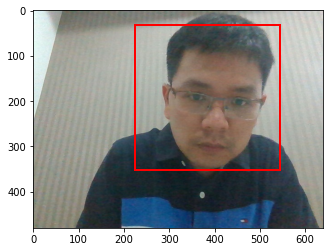

[(0.3804409, 2, 7, 2), (0.3683982, 1, 7, 2), (0.35178667, 2, 8, 2), (0.35082418, 3, 8, 1), (0.34304112, 1, 8, 2), (0.33639666, 1, 6, 2), (0.33356875, 5, 9, 1), (0.32900125, 2, 6, 2), (0.3216379, 3, 9, 1), (0.31827542, 4, 9, 1), (0.3120458, 4, 8, 1), (0.30771112, 5, 10, 1), (0.3058564, 2, 8, 1), (0.30103523, 4, 11, 1), (0.3001647, 3, 7, 2), (0.30002612, 0, 7, 2), (0.29684076, 0, 8, 2), (0.2953709, 2, 9, 1), (0.2895281, 5, 8, 1), (0.28338626, 3, 8, 2), (0.2825449, 3, 7, 1), (0.28209236, 4, 10, 1), (0.2748304, 1, 5, 2), (0.27169192, 1, 9, 2), (0.2667746, 2, 5, 2), (0.26550236, 0, 6, 2), (0.26530537, 2, 9, 2), (0.2646779, 4, 7, 1), (0.2634809, 5, 11, 1), (0.26325998, 3, 11, 1), (0.2618026, 3, 6, 2), (0.25449747, 2, 11, 1), (0.25140694, 1, 11, 1), (0.24953409, 3, 10, 1), (0.24876392, 0, 9, 2), (0.2475122, 2, 10, 1), (0.23931591, 1, 9, 1), (0.23490123, 1, 10, 1), (0.23476255, 4, 7, 2), (0.23455328, 1, 8, 1), (0.23405051, 1, 4, 2), (0.23295744, 2, 4, 2), (0.23106222, 2, 7, 1), (0.22845897, 5,

<Figure size 1152x1152 with 0 Axes>

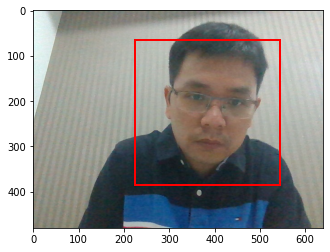

[(0.3689947, 5, 9, 1), (0.3607405, 4, 9, 1), (0.35903957, 4, 8, 1), (0.35834736, 2, 7, 2), (0.3508782, 5, 10, 1), (0.34470305, 3, 8, 1), (0.33956358, 3, 9, 1), (0.3381455, 5, 8, 1), (0.33408424, 1, 7, 2), (0.33192465, 4, 10, 1), (0.3290748, 2, 8, 2), (0.3286711, 1, 6, 2), (0.3280389, 2, 6, 2), (0.32211742, 6, 9, 1), (0.31789514, 4, 11, 1), (0.30747765, 3, 7, 2), (0.30524287, 1, 8, 2), (0.29790986, 6, 10, 1), (0.29655167, 5, 11, 1), (0.29238802, 6, 8, 1), (0.28534174, 3, 8, 2), (0.27994388, 0, 7, 2), (0.27881244, 3, 10, 1), (0.2771718, 2, 9, 1), (0.2700775, 1, 5, 2), (0.26727146, 3, 6, 2), (0.26722908, 0, 6, 2), (0.26712662, 3, 11, 1), (0.26712182, 4, 7, 1), (0.26584542, 2, 8, 1), (0.26387364, 2, 5, 2), (0.26083547, 0, 8, 2), (0.25602388, 2, 9, 2), (0.2557855, 3, 7, 1), (0.2502004, 5, 7, 1), (0.24817263, 1, 9, 2), (0.2413388, 2, 11, 1), (0.23998758, 2, 10, 1), (0.23898676, 4, 7, 2), (0.2377937, 6, 11, 1), (0.22848906, 4, 6, 2), (0.22408585, 0, 5, 2), (0.22304825, 4, 8, 2), (0.21834591, 

<Figure size 1152x1152 with 0 Axes>

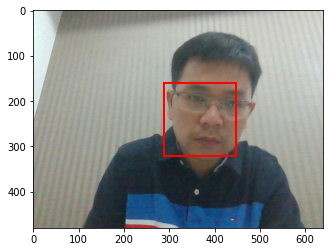

[(0.41728148, 4, 9, 1), (0.41438857, 5, 9, 1), (0.39339536, 5, 10, 1), (0.38354337, 4, 10, 1), (0.37208033, 3, 9, 1), (0.37076727, 4, 8, 1), (0.35321957, 6, 9, 1), (0.34808594, 2, 6, 2), (0.3473721, 2, 7, 2), (0.34593052, 3, 8, 1), (0.34072453, 5, 8, 1), (0.3386482, 1, 6, 2), (0.3310452, 4, 11, 1), (0.32591465, 2, 8, 2), (0.32516837, 3, 10, 1), (0.3225554, 6, 10, 1), (0.32254094, 1, 7, 2), (0.31361556, 3, 7, 2), (0.3071373, 5, 11, 1), (0.30015293, 6, 8, 1), (0.29716864, 3, 8, 2), (0.29603404, 1, 8, 2), (0.29236883, 3, 11, 1), (0.2891314, 3, 6, 2), (0.28592828, 2, 5, 2), (0.28059965, 1, 5, 2), (0.2764979, 4, 7, 1), (0.27634966, 2, 9, 1), (0.26937243, 2, 9, 2), (0.26182577, 2, 11, 1), (0.2618117, 7, 9, 1), (0.2598089, 2, 8, 1), (0.25785905, 5, 7, 1), (0.25587717, 2, 10, 1), (0.25026304, 4, 12, 1), (0.24713692, 1, 9, 2), (0.24464801, 4, 7, 2), (0.24460378, 3, 7, 1), (0.24329877, 3, 12, 1), (0.24073604, 6, 11, 1), (0.24062441, 4, 6, 2), (0.23861706, 3, 9, 2), (0.23580895, 3, 5, 2), (0.2355

<Figure size 1152x1152 with 0 Axes>

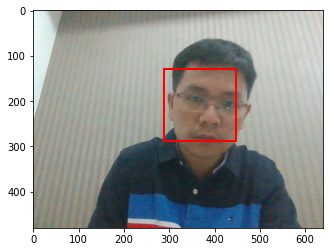

[(0.43809274, 4, 9, 1), (0.42034858, 4, 10, 1), (0.40980634, 5, 9, 1), (0.389129, 5, 10, 1), (0.37807187, 4, 8, 1), (0.36508158, 3, 9, 1), (0.34971765, 3, 10, 1), (0.34713426, 5, 8, 1), (0.32140154, 3, 8, 1), (0.31989735, 2, 6, 2), (0.31903753, 4, 11, 1), (0.3145756, 6, 9, 1), (0.31386414, 1, 6, 2), (0.30792475, 2, 7, 2), (0.2988542, 1, 7, 2), (0.29490528, 2, 8, 2), (0.29381275, 3, 6, 2), (0.29377848, 3, 7, 2), (0.291478, 3, 11, 1), (0.28721502, 6, 10, 1), (0.27980396, 5, 11, 1), (0.27956685, 6, 8, 1), (0.27900437, 1, 8, 2), (0.2753867, 0, 6, 2), (0.27461934, 3, 8, 2), (0.27276534, 4, 7, 1), (0.26970053, 2, 10, 1), (0.2685767, 2, 5, 2), (0.26766476, 5, 7, 1), (0.2639383, 2, 11, 1), (0.2637159, 0, 7, 2), (0.26005375, 1, 5, 2), (0.256555, 2, 9, 1), (0.24897052, 3, 12, 1), (0.2474333, 2, 9, 2), (0.24353607, 4, 12, 1), (0.2412988, 4, 6, 2), (0.2377312, 0, 8, 2), (0.23546702, 2, 12, 1), (0.23486507, 3, 9, 2), (0.23467906, 3, 5, 2), (0.23384666, 2, 8, 1), (0.23373696, 4, 7, 2), (0.2297983, 0

<Figure size 1152x1152 with 0 Axes>

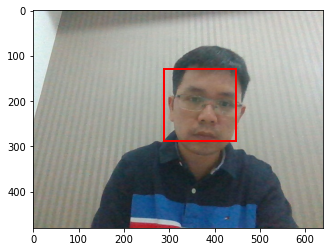

[(0.48009855, 4, 9, 1), (0.43818733, 5, 9, 1), (0.4268017, 4, 10, 1), (0.40096515, 4, 8, 1), (0.38104075, 5, 10, 1), (0.3660842, 3, 9, 1), (0.3600954, 5, 8, 1), (0.3463695, 3, 10, 1), (0.3225079, 6, 9, 1), (0.30912557, 3, 8, 1), (0.30620843, 4, 11, 1), (0.30493882, 1, 6, 2), (0.2970573, 2, 6, 2), (0.29450753, 4, 7, 1), (0.2839661, 5, 7, 1), (0.2794898, 6, 8, 1), (0.27564293, 3, 6, 2), (0.27484927, 2, 7, 2), (0.27472872, 1, 7, 2), (0.27310774, 6, 10, 1), (0.27225643, 2, 5, 2), (0.27113512, 3, 7, 2), (0.27112633, 0, 6, 2), (0.2690986, 1, 5, 2), (0.26844788, 5, 11, 1), (0.26569358, 3, 11, 1), (0.2639086, 3, 8, 2), (0.26185176, 2, 10, 1), (0.26085055, 2, 8, 2), (0.24661933, 1, 8, 2), (0.24433823, 0, 7, 2), (0.24383122, 4, 12, 1), (0.24363954, 2, 9, 1), (0.24078256, 3, 5, 2), (0.23756404, 0, 5, 2), (0.23191628, 3, 12, 1), (0.23130918, 4, 6, 2), (0.2301807, 4, 7, 2), (0.22534543, 2, 11, 1), (0.22529526, 3, 9, 2), (0.22367626, 4, 8, 2), (0.22326808, 6, 7, 1), (0.22118136, 3, 7, 1), (0.2180009

<Figure size 1152x1152 with 0 Axes>

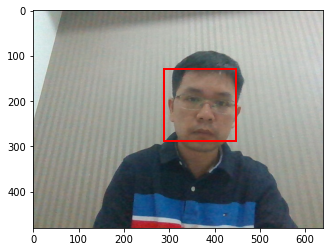

[(0.5118855, 4, 9, 1), (0.4617066, 4, 10, 1), (0.43631676, 5, 9, 1), (0.39680907, 4, 8, 1), (0.39297298, 3, 9, 1), (0.39018682, 3, 10, 1), (0.37811872, 5, 10, 1), (0.33793044, 5, 8, 1), (0.31854445, 4, 11, 1), (0.30432627, 3, 8, 1), (0.30006817, 6, 9, 1), (0.2925818, 3, 11, 1), (0.28656447, 2, 10, 1), (0.28308624, 4, 7, 1), (0.2818468, 1, 6, 2), (0.28096375, 2, 6, 2), (0.27307963, 2, 5, 2), (0.2680874, 3, 6, 2), (0.26198202, 5, 11, 1), (0.2618799, 0, 6, 2), (0.26091665, 1, 5, 2), (0.25709733, 5, 7, 1), (0.25445065, 2, 9, 1), (0.25348637, 1, 7, 2), (0.25340372, 6, 10, 1), (0.2531984, 3, 5, 2), (0.25276324, 6, 8, 1), (0.24899422, 2, 7, 2), (0.24856235, 3, 7, 2), (0.24701458, 3, 8, 2), (0.24123403, 2, 11, 1), (0.24054198, 4, 12, 1), (0.24033009, 2, 8, 2), (0.23996036, 0, 7, 2), (0.23794818, 1, 8, 2), (0.23698089, 3, 12, 1), (0.23201202, 0, 5, 2), (0.2265057, 4, 6, 2), (0.22525828, 3, 9, 2), (0.22115548, 0, 8, 2), (0.21786623, 4, 8, 2), (0.2152939, 4, 7, 2), (0.21219945, 3, 7, 1), (0.21057

<Figure size 1152x1152 with 0 Axes>

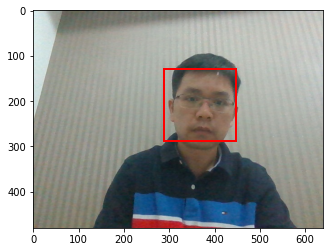

[(0.55467886, 4, 9, 1), (0.4528368, 5, 9, 1), (0.451947, 4, 10, 1), (0.40315375, 4, 8, 1), (0.3967428, 3, 9, 1), (0.36474705, 5, 10, 1), (0.36316702, 3, 10, 1), (0.33558467, 5, 8, 1), (0.30035177, 4, 11, 1), (0.29474363, 6, 9, 1), (0.29080927, 3, 8, 1), (0.28758037, 1, 6, 2), (0.27693075, 2, 5, 2), (0.27599114, 2, 6, 2), (0.27504, 4, 7, 1), (0.26947376, 1, 5, 2), (0.26579756, 2, 10, 1), (0.26560643, 0, 6, 2), (0.26417434, 3, 11, 1), (0.25766918, 3, 6, 2), (0.25562638, 3, 5, 2), (0.2529549, 1, 7, 2), (0.24790372, 5, 11, 1), (0.2469697, 5, 7, 1), (0.24358904, 6, 10, 1), (0.24336132, 2, 9, 1), (0.24127299, 2, 7, 2), (0.23941536, 3, 8, 2), (0.23920073, 0, 5, 2), (0.23674034, 0, 7, 2), (0.2359476, 6, 8, 1), (0.23586087, 2, 8, 2), (0.23585041, 3, 7, 2), (0.23332739, 4, 12, 1), (0.23318918, 1, 8, 2), (0.22475852, 3, 12, 1), (0.21725778, 4, 6, 2), (0.21416327, 0, 8, 2), (0.21300243, 2, 11, 1), (0.21287118, 3, 9, 2), (0.2083221, 4, 8, 2), (0.2057466, 4, 5, 2), (0.2056505, 4, 7, 2), (0.20238867,

<Figure size 1152x1152 with 0 Axes>

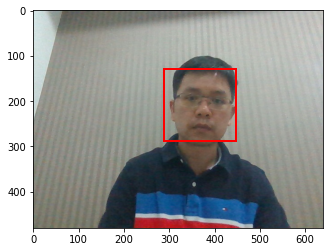

[(0.53058887, 4, 9, 1), (0.4347815, 4, 10, 1), (0.4225762, 5, 9, 1), (0.3901398, 3, 9, 1), (0.38610843, 4, 8, 1), (0.35616875, 3, 10, 1), (0.3400907, 5, 10, 1), (0.31675273, 5, 8, 1), (0.2849085, 3, 8, 1), (0.2828353, 4, 11, 1), (0.27835032, 6, 9, 1), (0.27363688, 4, 7, 1), (0.25458696, 1, 6, 2), (0.25323904, 3, 11, 1), (0.25011584, 0, 6, 2), (0.24350831, 2, 10, 1), (0.24260046, 2, 5, 2), (0.24225447, 1, 5, 2), (0.24027845, 5, 7, 1), (0.23880117, 2, 9, 1), (0.2332256, 2, 6, 2), (0.22899087, 1, 7, 2), (0.2280531, 6, 10, 1), (0.227108, 5, 11, 1), (0.22707918, 0, 5, 2), (0.22670698, 3, 5, 2), (0.2251583, 6, 8, 1), (0.222442, 0, 7, 2), (0.22107121, 3, 6, 2), (0.20964551, 3, 8, 2), (0.20882381, 1, 8, 2), (0.2073134, 2, 7, 2), (0.20664062, 4, 12, 1), (0.20609961, 3, 7, 1), (0.20561531, 4, 6, 2), (0.20485741, 3, 7, 2), (0.20091397, 2, 8, 2), (0.19774647, 3, 9, 2), (0.19658922, 0, 8, 2), (0.19393665, 4, 6, 1), (0.19356404, 3, 12, 1), (0.19329703, 4, 5, 2), (0.19249885, 4, 7, 2), (0.18748832, 4

<Figure size 1152x1152 with 0 Axes>

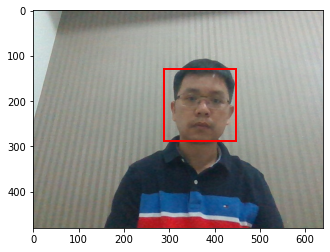

[(0.5464723, 4, 9, 1), (0.44406617, 5, 9, 1), (0.44081444, 4, 10, 1), (0.3924139, 3, 9, 1), (0.3781602, 4, 8, 1), (0.35414547, 3, 10, 1), (0.3501871, 5, 10, 1), (0.32604063, 5, 8, 1), (0.2906783, 4, 11, 1), (0.2772693, 6, 9, 1), (0.27391914, 3, 8, 1), (0.26954997, 4, 7, 1), (0.2530802, 3, 11, 1), (0.24702875, 1, 6, 2), (0.24579532, 1, 5, 2), (0.24374348, 5, 7, 1), (0.24252853, 2, 9, 1), (0.24193461, 0, 6, 2), (0.23687984, 2, 5, 2), (0.23489165, 0, 5, 2), (0.23216927, 2, 10, 1), (0.23182812, 5, 11, 1), (0.22369704, 6, 8, 1), (0.22159345, 6, 10, 1), (0.22144623, 2, 6, 2), (0.22126485, 4, 12, 1), (0.21713163, 3, 5, 2), (0.21459623, 1, 7, 2), (0.21244282, 0, 7, 2), (0.20489115, 3, 6, 2), (0.20353037, 3, 7, 1), (0.20146759, 1, 8, 2), (0.19649865, 3, 12, 1), (0.19534518, 3, 8, 2), (0.19531046, 0, 8, 2), (0.19260944, 4, 6, 2), (0.19253094, 2, 8, 2), (0.19218384, 3, 9, 2), (0.19156425, 2, 7, 2), (0.18938714, 4, 5, 2), (0.18625586, 4, 6, 1), (0.18519697, 3, 7, 2), (0.18472841, 5, 6, 2), (0.1831

<Figure size 1152x1152 with 0 Axes>

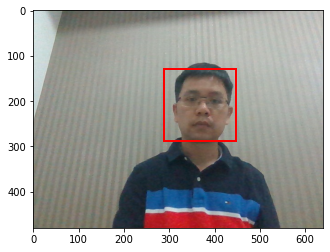

[(0.51163715, 4, 9, 1), (0.4397669, 4, 10, 1), (0.43179837, 5, 9, 1), (0.36804658, 3, 9, 1), (0.35472015, 5, 10, 1), (0.33744892, 3, 10, 1), (0.32844046, 4, 8, 1), (0.29601324, 4, 11, 1), (0.29226443, 5, 8, 1), (0.2631553, 6, 9, 1), (0.2531225, 3, 8, 1), (0.24414855, 4, 7, 1), (0.24334113, 2, 9, 1), (0.24065116, 5, 11, 1), (0.23599651, 3, 11, 1), (0.23582676, 1, 6, 2), (0.23104542, 0, 6, 2), (0.2304964, 1, 5, 2), (0.22995082, 4, 12, 1), (0.22511305, 2, 10, 1), (0.22281973, 2, 5, 2), (0.22182272, 5, 7, 1), (0.22062872, 2, 6, 2), (0.21905756, 0, 5, 2), (0.21134333, 6, 10, 1), (0.20262384, 3, 5, 2), (0.20062265, 6, 8, 1), (0.19950783, 1, 7, 2), (0.19802256, 3, 6, 2), (0.19152139, 0, 7, 2), (0.18967755, 3, 7, 1), (0.18839324, 2, 7, 2), (0.18608576, 5, 12, 1), (0.1860337, 3, 12, 1), (0.18532833, 4, 6, 2), (0.18462923, 4, 5, 2), (0.18460064, 2, 8, 1), (0.18407038, 1, 8, 2), (0.17802742, 2, 8, 2), (0.17297976, 5, 6, 2), (0.17218874, 0, 8, 2), (0.1717131, 3, 7, 2), (0.17168605, 4, 7, 2), (0.17

<Figure size 1152x1152 with 0 Axes>

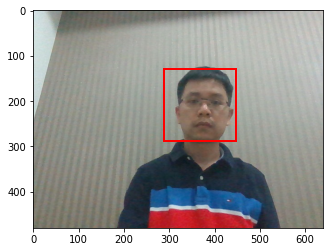

[(0.44871882, 5, 9, 1), (0.43841878, 4, 9, 1), (0.42701095, 4, 10, 1), (0.4196104, 5, 10, 1), (0.2982827, 5, 8, 1), (0.28925994, 6, 9, 1), (0.28139314, 4, 8, 1), (0.2805151, 3, 10, 1), (0.278411, 3, 9, 1), (0.27521616, 4, 11, 1), (0.26284742, 6, 10, 1), (0.25749564, 5, 11, 1), (0.23109092, 1, 6, 2), (0.22561431, 0, 6, 2), (0.22132717, 5, 7, 1), (0.21812493, 4, 12, 1), (0.21777067, 2, 6, 2), (0.21634063, 6, 8, 1), (0.20536886, 1, 5, 2), (0.20201427, 1, 7, 2), (0.20077817, 0, 5, 2), (0.20054612, 5, 12, 1), (0.19995871, 2, 5, 2), (0.19812106, 4, 7, 1), (0.19457537, 3, 11, 1), (0.19378752, 0, 7, 2), (0.19164565, 2, 7, 2), (0.19127299, 3, 8, 1), (0.19054581, 3, 6, 2), (0.1851883, 3, 5, 2), (0.18278363, 7, 9, 1), (0.17694779, 2, 9, 1), (0.17664367, 2, 10, 1), (0.17433487, 4, 8, 2), (0.17209865, 4, 9, 2), (0.1716465, 3, 9, 2), (0.17107293, 3, 7, 2), (0.17057434, 3, 8, 2), (0.17024708, 2, 8, 2), (0.16964372, 4, 6, 2), (0.1695525, 6, 11, 1), (0.16839015, 4, 7, 2), (0.16795856, 6, 7, 1), (0.1673

<Figure size 1152x1152 with 0 Axes>

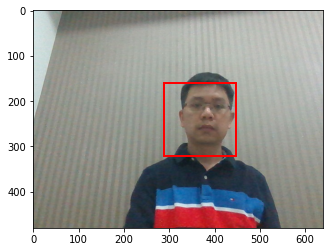

[(0.45109606, 5, 10, 1), (0.42956927, 5, 9, 1), (0.40511274, 4, 10, 1), (0.37735745, 4, 9, 1), (0.29081652, 6, 10, 1), (0.28900737, 5, 8, 1), (0.2887943, 6, 9, 1), (0.27437449, 5, 11, 1), (0.26188076, 3, 10, 1), (0.25833982, 4, 11, 1), (0.2550054, 4, 8, 1), (0.24670741, 3, 9, 1), (0.22574423, 1, 6, 2), (0.22075497, 5, 12, 1), (0.21819188, 6, 8, 1), (0.21519515, 5, 7, 1), (0.20570287, 2, 6, 2), (0.20165361, 4, 12, 1), (0.20157692, 1, 7, 2), (0.19855031, 1, 5, 2), (0.19081464, 2, 7, 2), (0.18961066, 4, 7, 1), (0.18557175, 6, 11, 1), (0.1816011, 2, 5, 2), (0.18083058, 3, 8, 1), (0.17789884, 3, 6, 2), (0.17656258, 3, 11, 1), (0.17601202, 7, 9, 1), (0.17002092, 7, 10, 1), (0.16703658, 3, 5, 2), (0.16680604, 4, 8, 2), (0.16574618, 2, 10, 1), (0.16534248, 2, 8, 2), (0.16487007, 3, 7, 2), (0.16444091, 6, 7, 1), (0.16202831, 4, 9, 2), (0.16192704, 4, 7, 2), (0.16171557, 4, 6, 2), (0.16059338, 5, 8, 2), (0.15939319, 5, 9, 2), (0.15908241, 1, 8, 2), (0.15887928, 2, 9, 1), (0.15780585, 3, 8, 2), (

<Figure size 1152x1152 with 0 Axes>

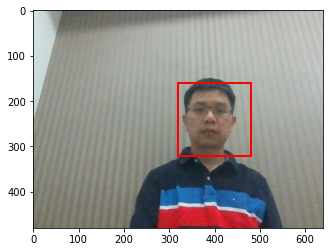

[(0.5098398, 5, 10, 1), (0.41608423, 5, 9, 1), (0.4087145, 4, 10, 1), (0.35754907, 6, 10, 1), (0.32883072, 4, 9, 1), (0.32513663, 5, 11, 1), (0.3082811, 6, 9, 1), (0.2740015, 5, 8, 1), (0.27164346, 3, 10, 1), (0.2712683, 4, 11, 1), (0.24345365, 5, 12, 1), (0.23115824, 6, 11, 1), (0.227175, 6, 8, 1), (0.22052711, 4, 8, 1), (0.22048557, 3, 9, 1), (0.218399, 1, 6, 2), (0.20476402, 2, 6, 2), (0.20382483, 1, 7, 2), (0.2036119, 2, 7, 2), (0.20054336, 7, 10, 1), (0.19840899, 4, 12, 1), (0.19639698, 3, 11, 1), (0.18850906, 3, 6, 2), (0.18721971, 5, 7, 1), (0.18520534, 7, 9, 1), (0.18510644, 3, 7, 2), (0.17424333, 2, 10, 1), (0.1729365, 4, 7, 2), (0.17271785, 6, 12, 1), (0.17200227, 4, 6, 2), (0.17076029, 2, 8, 2), (0.16908042, 4, 8, 2), (0.1689105, 3, 8, 2), (0.16781457, 5, 13, 1), (0.16555399, 5, 8, 2), (0.16471246, 5, 7, 2), (0.16332594, 5, 9, 2), (0.16322331, 4, 9, 2), (0.16319361, 5, 6, 2), (0.16126871, 3, 9, 2), (0.1595452, 6, 7, 1), (0.15830523, 1, 8, 2), (0.1574774, 2, 9, 2), (0.1539866

<Figure size 1152x1152 with 0 Axes>

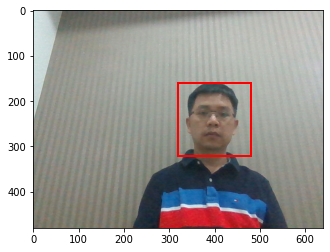

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

# next frame
PATH = '/content/drive/MyDrive/AI_research/AI_INSIGHT/HW20-21/tracking_images4/'
height_fm = 15
width_fm  = 20

# Create a Rectangle patch
scale_height = height//height_fm
scale_width  = width//width_fm

# search locally
current_x = 2
current_y = 2
searching_scope = 4

for index in range(70):
  image_t2 = kimage.load_img(PATH+'img'+str(index)+'.jpg', 
                             target_size=(height, width))
  
  # compute features for image_t2
  image_t2 = np.expand_dims(image_t2, axis=0)
  image_t2_features = model.predict(image_t2)

  # matching
  side = 5
  sim_data = []  
  current_scale_update = 1
  weight_scale = [0.9, 1.2]

  height_begin = max(0, current_y-searching_scope)
  height_end   = min(height_fm-side, current_y+searching_scope)

  width_begin = max(0, current_x-searching_scope)
  width_end   = min(width_fm-side, current_x+searching_scope)
  for scale_tt1, tt1_fm in enumerate(list_template_t1_fm): 
    scale_tt1 += 1
    for i in range(height_begin, height_end+1):
      for j in range(width_begin, width_end+1):
        if scale_tt1 == len(scale_range):
          template_t2_features = image_t2_features[0,i:i+side*scale_tt1,j:j+side*scale_tt1,:]
          w_scal = weight_scale[scale_tt1-1]
        else:
          template_t2_features = image_t2_features[0,i:i+side*current_scale_update,j:j+side*current_scale_update,:]
          w_scal = weight_scale[current_scale_update-1]
        # print(template_t2_features.shape)
        # print(tt1_fm.shape)
        try:
          sim = w_scal*cosine_similarity(np.reshape(template_t2_features, (1, -1)), 
                                  np.reshape(tt1_fm, (1,-1)))
        except:
          continue
        if scale_tt1 == len(scale_range):
          sim_data.append((sim[0][0], i, j, scale_tt1))
        else:
          sim_data.append((sim[0][0], i, j, current_scale_update))

  # sort
  tp_sorted = sorted(sim_data, key=getKey, reverse=True)
  print(tp_sorted)
  # draw bounding box
  plt.figure(figsize=(16,16))
  fig, ax = plt.subplots()

  # Display the image
  ax.imshow(image_t2[0])

  # update template
  current_x = tp_sorted[0][2]
  current_y = tp_sorted[0][1]
  
  template_t1_update = image_t2[:,current_y*scale_height:current_y*scale_height + patch_side*tp_sorted[i][3], current_x*scale_width:current_x*scale_width + patch_side*tp_sorted[i][3],:]
  current_scale_update = tp_sorted[i][3]
  # if len(list_template_t1_fm) == len(scale_range):
  #     list_template_t1_fm.append(list_template_t1_fm)
  # else:
  #   list_template_t1_fm[-1] = template_t1_update
  i = 0
  rect = patches.Rectangle((tp_sorted[i][2]*scale_width, tp_sorted[i][1]*scale_height), 
                          patch_side*tp_sorted[i][3], patch_side*tp_sorted[i][3], linewidth=2, edgecolor='r', facecolor='none')
  ax.add_patch(rect)
  plt.show()